**Table of contents**<a id='toc0_'></a>    
- 1. [Импорты и константы](#toc1_)    
- 2. [Предобработка данных](#toc2_)    
- 3. [Исследовательский аналази данных](#toc3_)    
  - 3.1. [Посмотрим на размер и данные в датасете](#toc3_1_)    
  - 3.2. [Изучение дисбаланса классов](#toc3_2_)    
  - 3.3. [acousticness - акустичность](#toc3_3_)    
  - 3.4. [danceability - танцевальность](#toc3_4_)    
  - 3.5. [duration_ms - продолжительность в милисекундах](#toc3_5_)    
  - 3.6. [energy - энергичность](#toc3_6_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# 1. <a id='toc1_'></a>[Импорты и константы](#toc0_)

In [2]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from numpy.random import RandomState

In [3]:
def get_data():
    return pd.read_csv('./datasets/kaggle_music_genre_train.csv')

In [4]:
data = get_data()

In [5]:
RANDOM_STATE = RandomState(42)
START_DATA_SIZE = data.shape[0]

# 2. <a id='toc2_'></a>[Предобработка данных](#toc0_)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       20394 non-null  float64
 1   track_name        20394 non-null  object 
 2   acousticness      20394 non-null  float64
 3   danceability      20394 non-null  float64
 4   duration_ms       20394 non-null  float64
 5   energy            20394 non-null  float64
 6   instrumentalness  20394 non-null  float64
 7   key               19659 non-null  object 
 8   liveness          20394 non-null  float64
 9   loudness          20394 non-null  float64
 10  mode              19888 non-null  object 
 11  speechiness       20394 non-null  float64
 12  tempo             19952 non-null  float64
 13  obtained_date     20394 non-null  object 
 14  valence           20394 non-null  float64
 15  music_genre       20394 non-null  object 
dtypes: float64(11), object(5)
memory usage: 

In [7]:
data.head()

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143.0,Highwayman,0.4800,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091.0,Toes Across The Floor,0.2430,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888.0,First Person on Earth,0.2280,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021.0,No Te Veo - Digital Single,0.0558,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852.0,Chasing Shadows,0.2270,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative


In [8]:
data.dropna(inplace=True)

In [9]:
data.drop_duplicates(inplace=True)

In [10]:
def preprocessing_string(value):
    return ' '.join(value.split()).lower()

In [11]:
def preprocessing_string_column(data, columns):
    for column in columns:
        data[column] = data[column].apply(preprocessing_string)
    return data

In [12]:
string_column = ['track_name', 'key', 'mode', 'obtained_date', 'music_genre']
data = preprocessing_string_column(data, string_column)

In [13]:
print(f'В результате удаления пропущенных значений и явных дубликатов в '
      f'датасете осталось {data.shape[0] / START_DATA_SIZE:.2%} данных')

В результате удаления пропущенных значений и явных дубликатов в датасете осталось 91.96% данных


# 3. <a id='toc3_'></a>[Исследовательский аналази данных](#toc0_)

Определим функции которые будем использовать для исследовательского анализа данных

In [14]:
def create_pivot_table(data, categories, column):
    '''
    Функция строит сводную таблицу признака по классам.
    В сводную таблицу попадают среднее, медиана, минимальное
    и максимальное значение признака. Также функиця строит столбчатую
    диаграмму по полученным медианам
    Функия принимает на вход:
    data - датасет
    categories - название колонки, содержащей категории
    column - название колонки с признаком
    Функция возвращает полученную сводную таблицу
    '''
    pv = (
        data
        .pivot_table(index=categories, values=column, aggfunc=['mean', 'median', 'min', 'max'])
        .reset_index().droplevel(1, axis=1)
        .set_index(categories)
    )
    pv.plot(kind='bar', y='median')
    return pv

In [15]:
def create_violinplot(data, column):
    '''
    Функиця строит диаграмму violinplot для указанного
    признака
    Функия принимает на вход:
    data - датасет
    column - название колонки с признаком
    '''
    _, ax = plt.subplots()
    ax.xaxis.grid(True)
    sb.violinplot(data=data, x=column, ax=ax)

In [16]:
def create_category_violinplot(data, categories, column, common=False):
    '''
    Функиця строит диаграммы violinplot для каждой категории
    Функия принимает на вход:
    data - датасет
    categories - название колонки, содержащей категории
    column - название колонки с признаком
    common - будевый признак, отражающие строить ли дополнительный график,
    содержащий графики всех категорий вместе
    '''
    for group_name, group_data in data.groupby(categories)[column]:
        df = pd.DataFrame(group_data.values, columns=[group_name])
        _, ax = plt.subplots()
        sb.violinplot(x=df[group_name], ax=ax)
        ax.xaxis.grid(True)
    if common:
        _, ax_common = plt.subplots(figsize=(20,30))
        ax_common.xaxis.grid(True)
        sb.violinplot(data=data, x=column, y=categories, ax=ax_common)

In [34]:
def create_countplot(data, column):
    '''
    Функиця строит столбчатую диаграмму для указанного признака
    Функия принимает на вход:
    data - датасет
    column - название колонки с признаком
    '''
    _, ax = plt.subplots()
    ax.xaxis.grid(True)
    sb.countplot(data=data, x=column, ax=ax)

In [32]:
def create_category_countplot(data, categories, column):
    '''
    Функиця строит столбчатые диаграммы для каждой категории
    Функия принимает на вход:
    data - датасет
    categories - название колонки, содержащей категории
    column - название колонки с признаком
    '''
    for group_name, group_data in data.groupby(categories)[column]:
        df = pd.DataFrame(group_data.values, columns=[group_name])
        _, ax = plt.subplots()
        sb.countplot(x=df[group_name], ax=ax)
        ax.xaxis.grid(True)

## 3.1. <a id='toc3_1_'></a>[Посмотрим на размер и данные в датасете](#toc0_)

В датасете чуть более 20000 строк. Однако некоторые колонки имеют пропуски.  
К количественным признакам относятся столбцы:
* acousticness - акустичность
* danceability - танцевальность
* duration_ms -продолжительность в милисекундах
* energy - энергичность
* instrumentalness - инструментальность
* liveness - привлекательность
* loudness - громкость
* speechiness - выразительность
* tempo - темп
* valence - привлекательность произведения для пользователей сервиса


К категориальным с признакам относятся столбцы:
* track_name - название трека  
* key - базовый ключ (нота) произведения
* mode - указывает на модальность (мажорную или минорную) трека
* obtained_date - дата загрузки в сервис


Целевое признак находится в столбце music_genre (музыкальный жанр)

## 3.2. <a id='toc3_2_'></a>[Изучение дисбаланса классов](#toc0_)

In [17]:
data.groupby('music_genre')['instance_id'].count()

music_genre
alternative    2398
anime          1751
blues          2628
classical      1267
country        1946
electronic     2363
hip-hop        1058
jazz           1158
rap            2210
rock           1975
Name: instance_id, dtype: int64

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
acousticness,1.000000,-0.273237,0.046802,-0.764678,0.319564,-0.091182,-0.699626,-0.144917,-0.216577,-0.224391
danceability,-0.273237,1.000000,-0.146138,0.183294,-0.253828,-0.079297,0.315529,0.258334,-0.059486,0.391941
duration_ms,0.046802,-0.146138,1.000000,-0.057486,0.142109,0.032049,-0.099702,-0.082223,-0.042661,-0.125683
energy,-0.764678,0.183294,-0.057486,1.000000,-0.321163,0.176234,0.821459,0.151155,0.250851,0.350350
instrumentalness,0.319564,-0.253828,0.142109,-0.321163,1.000000,-0.063952,-0.482528,-0.176356,-0.097125,-0.259166
liveness,-0.091182,-0.079297,0.032049,0.176234,-0.063952,1.000000,0.108233,0.097633,0.038290,0.037236
loudness,-0.699626,0.315529,-0.099702,0.821459,-0.482528,0.108233,1.000000,0.151618,0.221536,0.285109
speechiness,-0.144917,0.258334,-0.082223,0.151155,-0.176356,0.097633,0.151618,1.000000,0.065866,0.032113
tempo,-0.216577,-0.059486,-0.042661,0.250851,-0.097125,0.038290,0.221536,0.065866,1.000000,0.085729
valence,-0.224391,0.391941,-0.125683,0.350350,-0.259166,0.037236,0.285109,0.032113,0.085729,1.000000


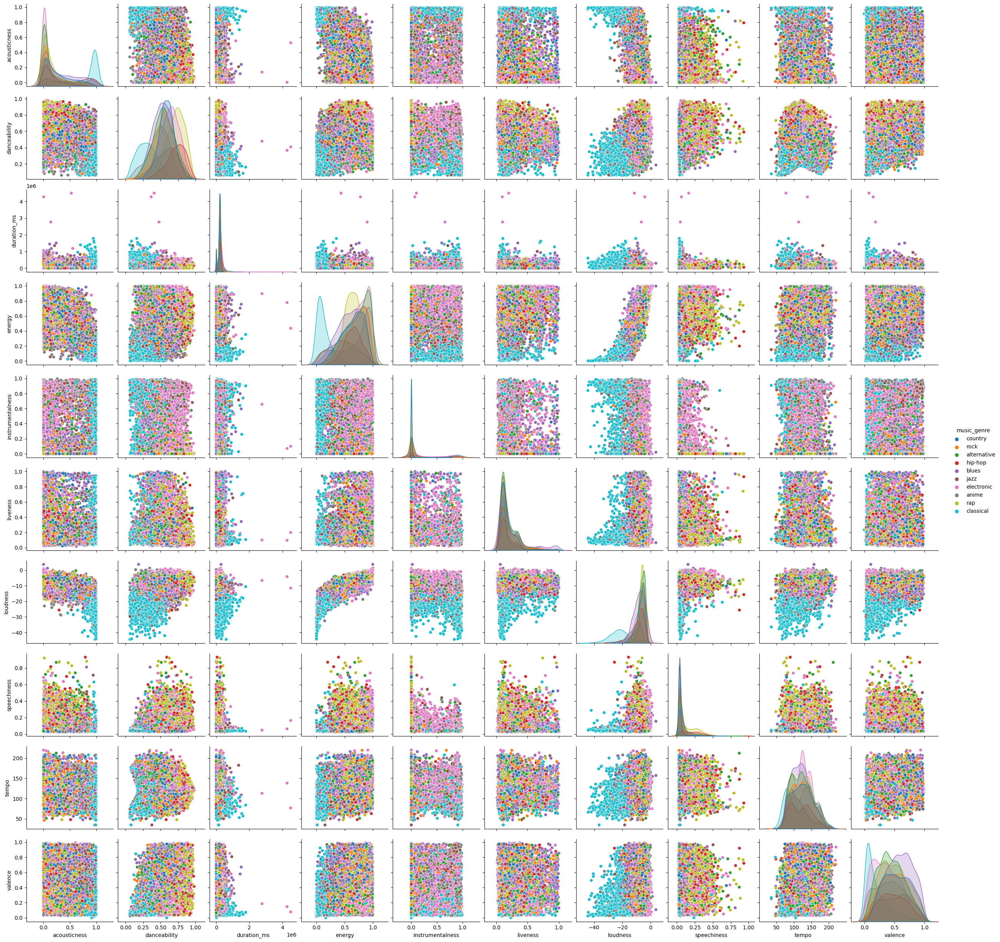

In [18]:
data_plot = data.drop(['instance_id', 'track_name', 'obtained_date'], axis=1)
sb.pairplot(data_plot, hue='music_genre')

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
acousticness,1.000000,-0.273237,0.046802,-0.764678,0.319564,-0.091182,-0.699626,-0.144917,-0.216577,-0.224391
danceability,-0.273237,1.000000,-0.146138,0.183294,-0.253828,-0.079297,0.315529,0.258334,-0.059486,0.391941
duration_ms,0.046802,-0.146138,1.000000,-0.057486,0.142109,0.032049,-0.099702,-0.082223,-0.042661,-0.125683
energy,-0.764678,0.183294,-0.057486,1.000000,-0.321163,0.176234,0.821459,0.151155,0.250851,0.350350
instrumentalness,0.319564,-0.253828,0.142109,-0.321163,1.000000,-0.063952,-0.482528,-0.176356,-0.097125,-0.259166
liveness,-0.091182,-0.079297,0.032049,0.176234,-0.063952,1.000000,0.108233,0.097633,0.038290,0.037236
loudness,-0.699626,0.315529,-0.099702,0.821459,-0.482528,0.108233,1.000000,0.151618,0.221536,0.285109
speechiness,-0.144917,0.258334,-0.082223,0.151155,-0.176356,0.097633,0.151618,1.000000,0.065866,0.032113
tempo,-0.216577,-0.059486,-0.042661,0.250851,-0.097125,0.038290,0.221536,0.065866,1.000000,0.085729
valence,-0.224391,0.391941,-0.125683,0.350350,-0.259166,0.037236,0.285109,0.032113,0.085729,1.000000


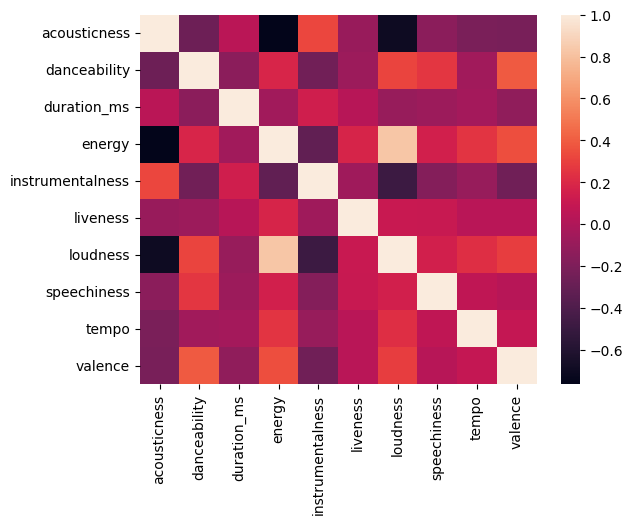

In [11]:
numeric_columns = ['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
corr_matrix = data[numeric_columns].corr()
sb.heatmap(corr_matrix)
corr_matrix

## 3.3. <a id='toc3_3_'></a>[acousticness - акустичность](#toc0_)

Выведем описательную статиcтику по окустичности

In [19]:
data['acousticness'].describe()

count    18754.000000
mean         0.275025
std          0.321970
min          0.000000
25%          0.015000
50%          0.121000
75%          0.471000
max          0.996000
Name: acousticness, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,0.165384,0.03150,0.000001,0.984
anime,0.272324,0.05190,0.000000,0.996
blues,0.310891,0.20650,0.000002,0.995
classical,0.878808,0.96900,0.000005,0.996
country,0.273586,0.19000,0.000108,0.971
electronic,0.121596,0.02630,0.000003,0.984
hip-hop,0.181910,0.10700,0.000087,0.936
jazz,0.501659,0.52100,0.000008,0.996
rap,0.168338,0.09415,0.000007,0.942


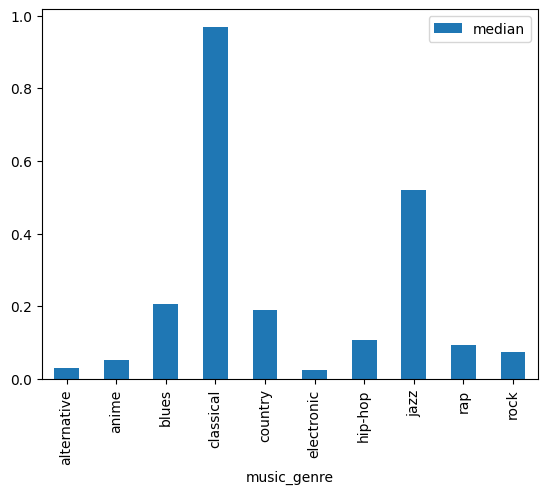

In [20]:
create_pivot_table(data, 'music_genre', 'acousticness')

Из сводной таблицы и графика видно, что жанры `classical` и `jazz` обладают самой большим значением медианы музыкальности. Наиболее выделяется жанр `classical`

Построим график violinlpot

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


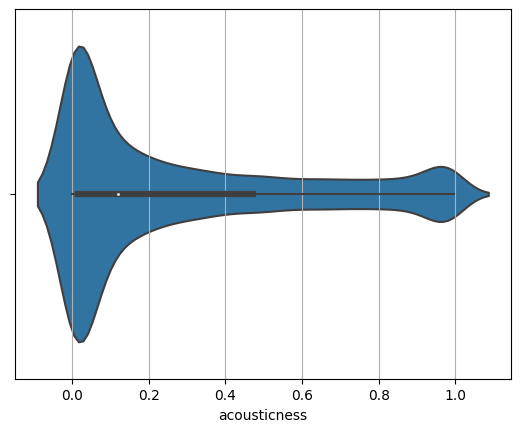

In [21]:
create_violinplot(data, 'acousticness')

График плотности имеет 2 вершины: основная около 0 и маленькая около 1.  
Чтобы подробнее изучить распределение данного параметра, сгруппируем данные по категориям и для каждой категории построим такой же график

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

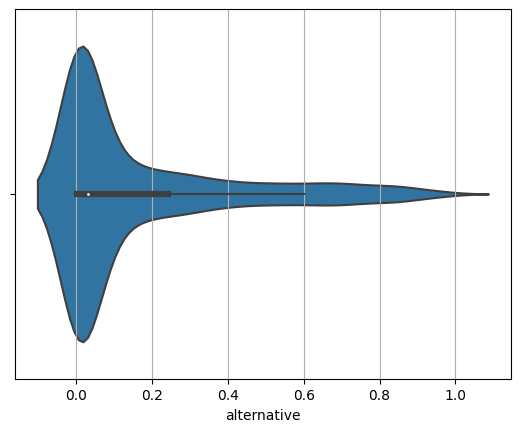

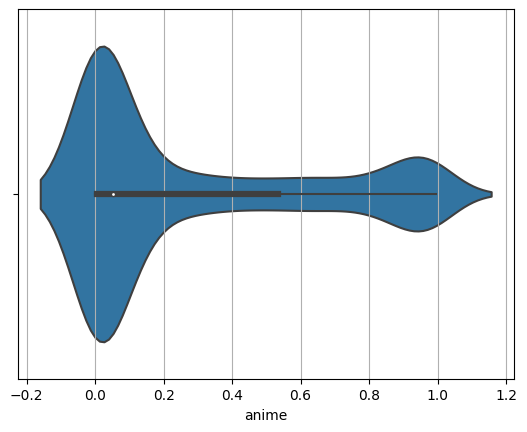

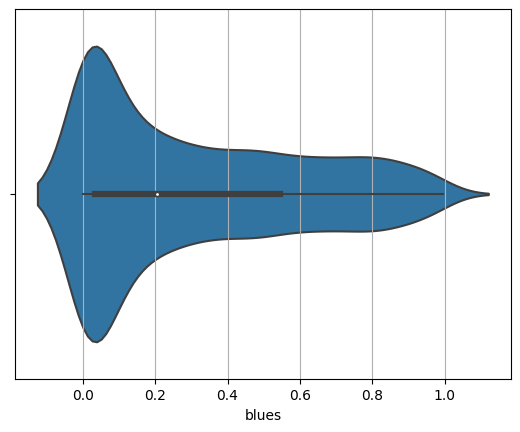

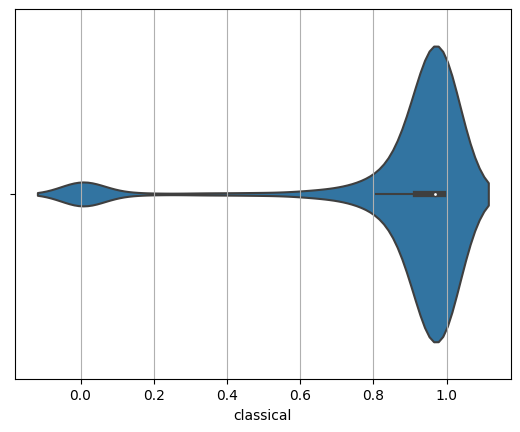

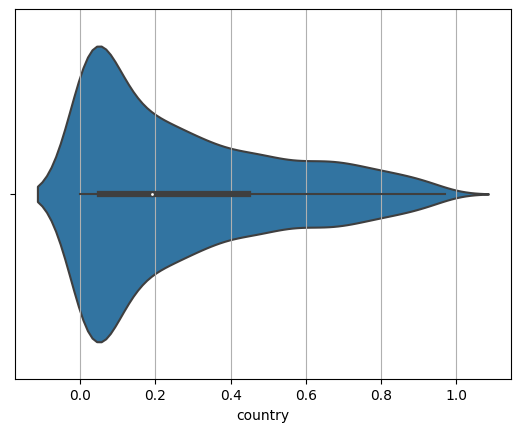

...

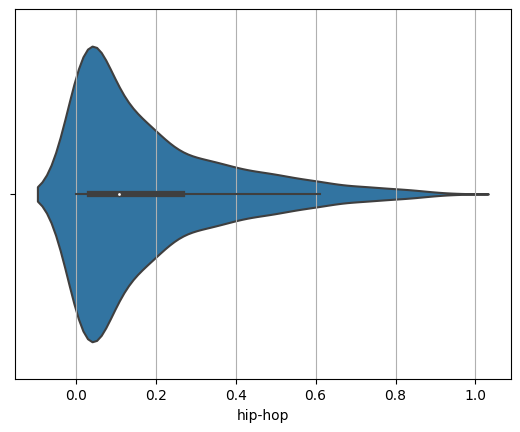

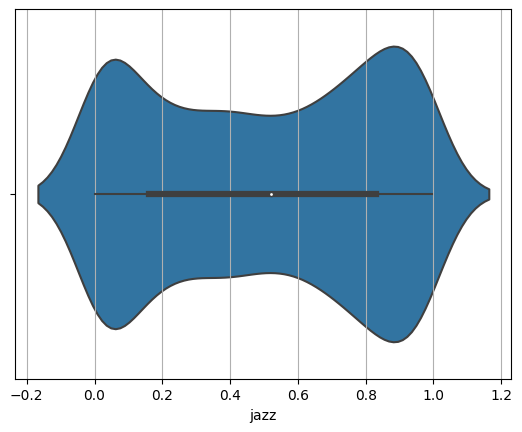

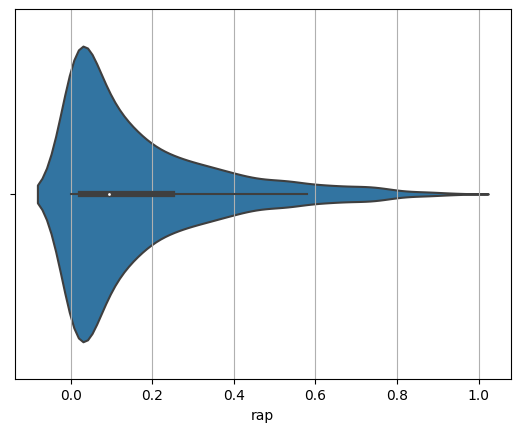

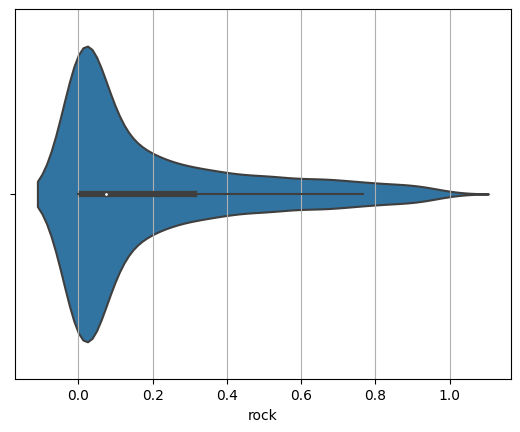

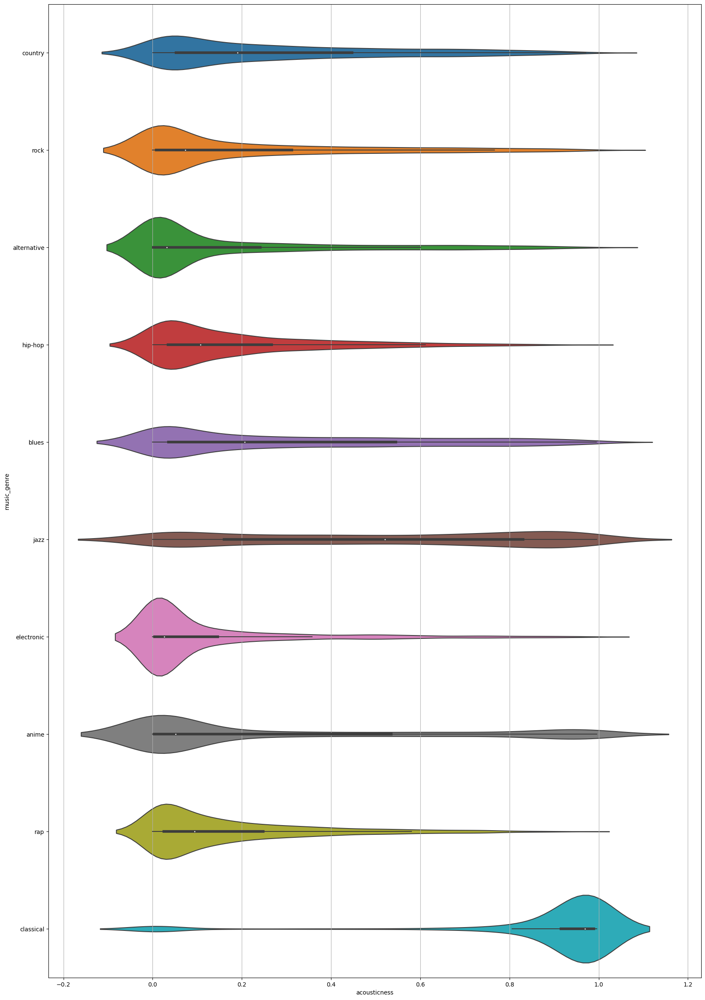

In [22]:
create_category_violinplot(data, 'music_genre', 'acousticness', True)

Из полученных графиков можно увидеть несколько особенностей:
1. Из всех жанров выделяется музыка с жанром `classical`. Пик ее распределения находится не около 0 (как у большинства жанров), а около 1. При этом около 0 таже есть небольшой пик. Однако он находится за пределами усов, поэтому, возможно, это выбросы. Либо это поджанр классической музыки, который обладает невыской акустичностью
2. График плотности жанра `jazz` имеет 2 равнозначных пика: около 0 и около 1. Скорее всего, данный жанр не получится отделить данным параметром.
3. Плотность графика жанра `anime` также имеет 2 пика. Однако в отличии от жанра `jazz` пик около 0 более выраженный, чем пик около 1.

## 3.4. <a id='toc3_4_'></a>[danceability - танцевальность](#toc0_)

In [23]:
data['danceability'].describe()

count    18754.000000
mean         0.561725
std          0.171969
min          0.060000
25%          0.451000
50%          0.570000
75%          0.682000
max          0.978000
Name: danceability, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,0.545996,0.544,0.1030,0.949
anime,0.468861,0.482,0.0606,0.888
blues,0.526990,0.529,0.1480,0.955
classical,0.303753,0.298,0.0600,0.756
country,0.580139,0.583,0.2030,0.953
electronic,0.618282,0.631,0.0822,0.969
hip-hop,0.718776,0.736,0.2840,0.978
jazz,0.582520,0.597,0.0644,0.955
rap,0.701716,0.720,0.1970,0.975


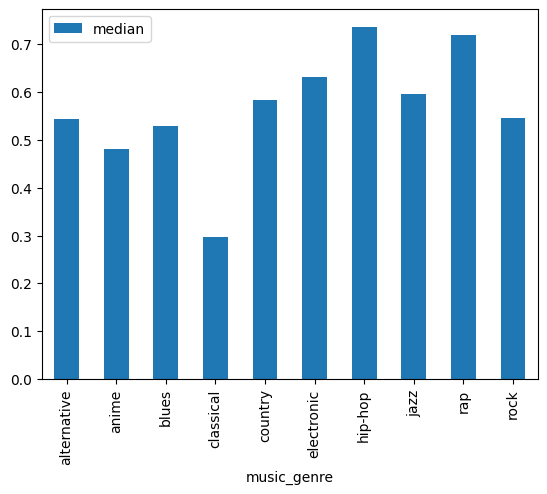

In [24]:
create_pivot_table(data, 'music_genre', 'danceability')

Из сводной таблицы и гистограммы видно, что жанры `hip-hop` и `rap` имею максимальное значение медианы данного критерия (0.736 и 0.720 соответственно). Также сильно выделяется жанр `classical` - он имеет минимальное медианное значение 0.298, что сильно меньше, чем у остальных жанров.

Посмотрим на скрипичную диаграмму для данного критерия по всем данным

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


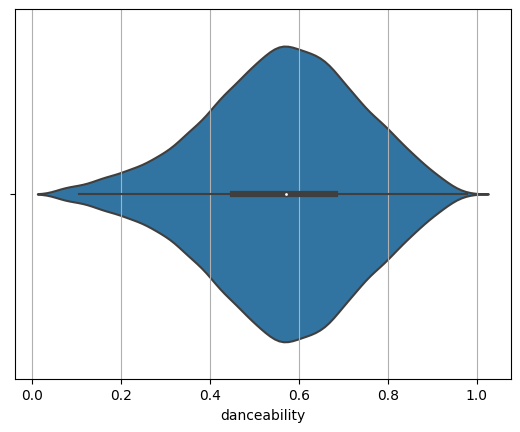

In [25]:
create_violinplot(data, 'danceability')

График распределения похож на нормальное распределение с большое дисперсией. Также видно, что имеются выбросы.  
Чтобы подробнее изучить распределение данного параметра, сгруппируем данные по категориям и для каждой категории построим такой же график

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

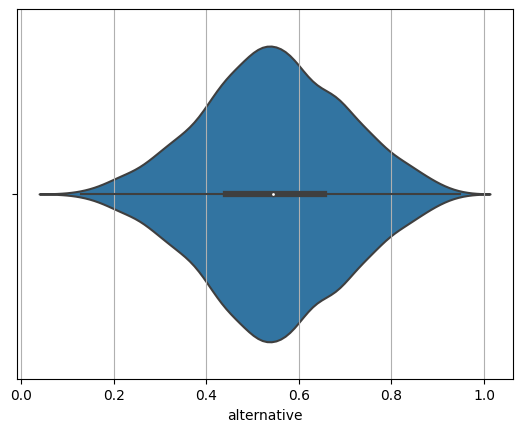

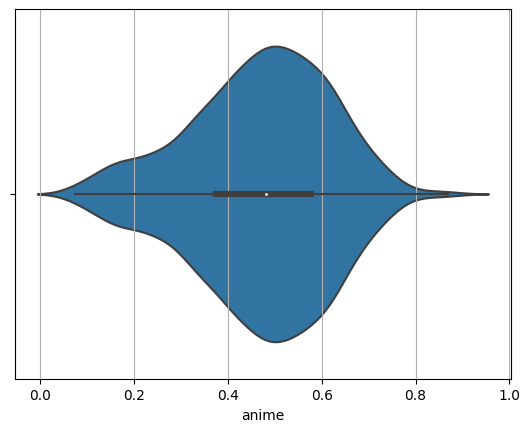

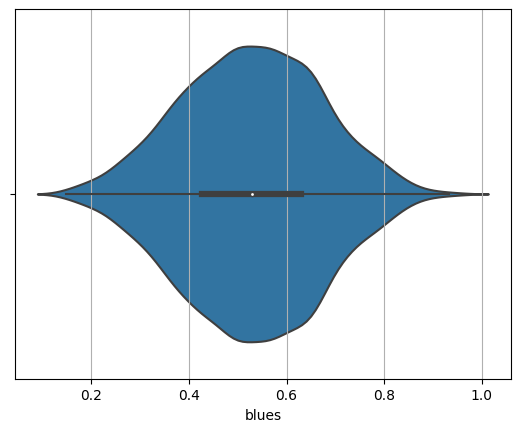

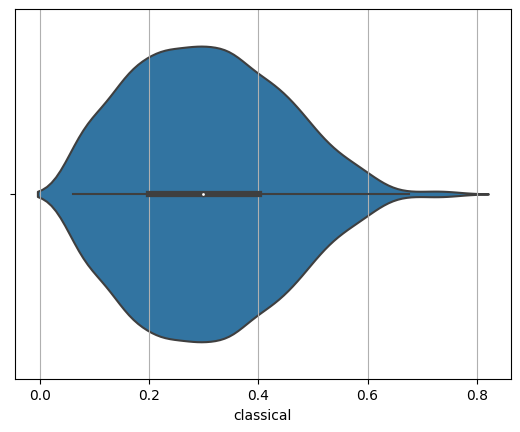

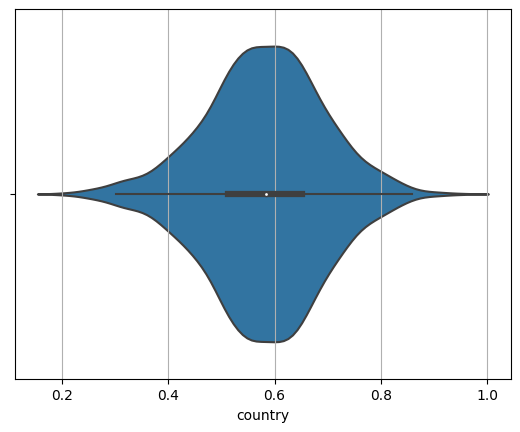

...

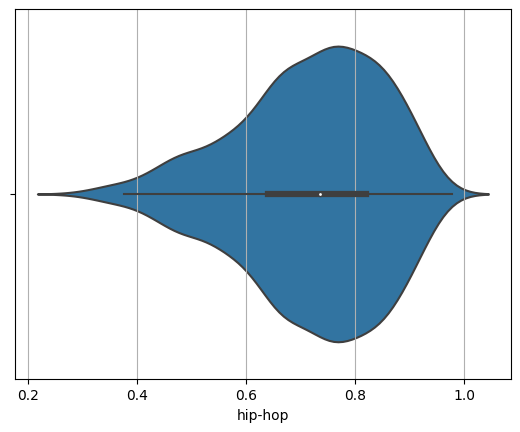

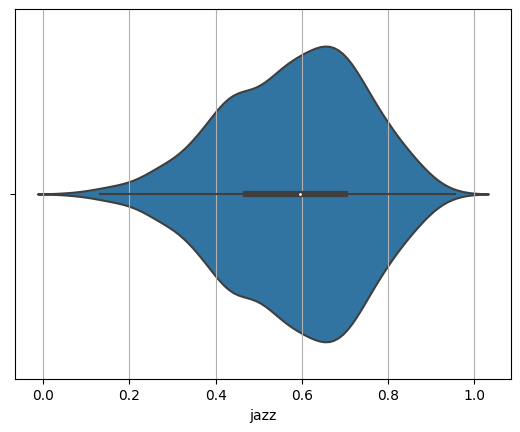

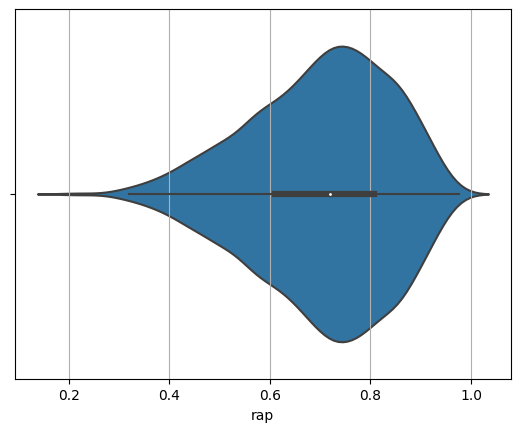

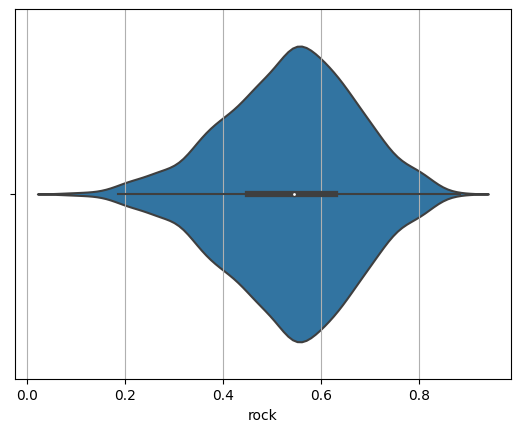

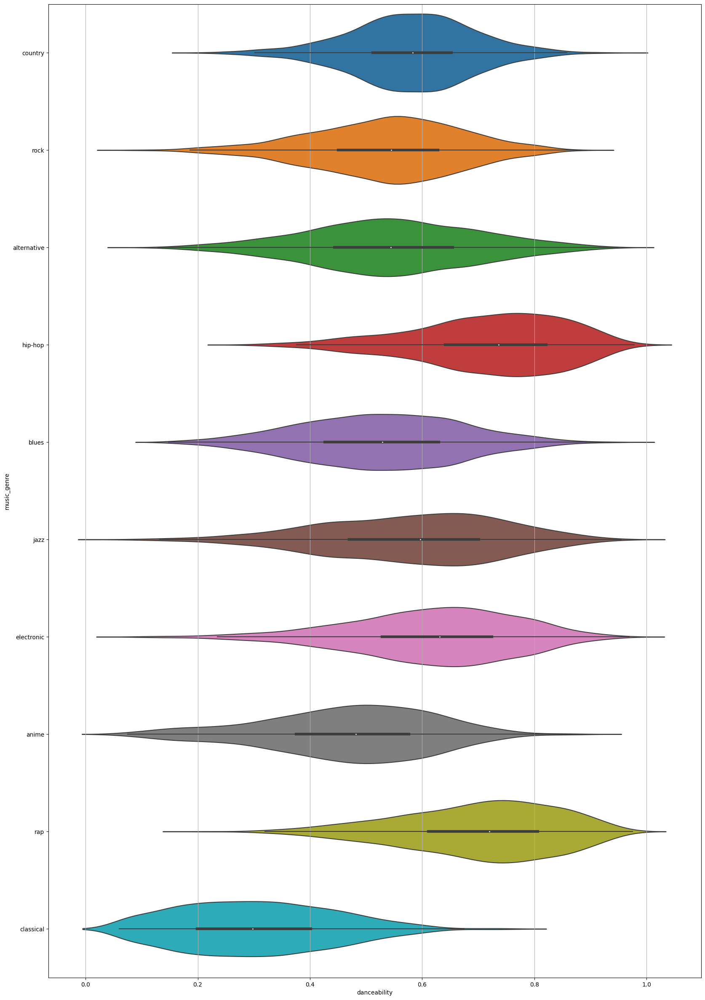

In [26]:
create_category_violinplot(data, 'music_genre', 'danceability', True)

Распределение плотности данного критерия для каждой категории очень похожи. Основное отличие заключается в мат ожидании распределения. У жанров `hip-hop` и `rap` мат ожидание наиболее смещено к 1. У жанра `classial` наоброт мат ожидание имеет наименьшее значение, поэтому график наиболее смещен влево. Данная информаци подтверждает те выводы, которые были сделаны из сводной таблицы и гистограммы распределения медиан.

## 3.5. <a id='toc3_5_'></a>[duration_ms - продолжительность в милисекундах](#toc0_)

In [27]:
data['duration_ms'].describe()

count    1.875400e+04
mean     2.207254e+05
std      1.273069e+05
min     -1.000000e+00
25%      1.775178e+05
50%      2.197095e+05
75%      2.665068e+05
max      4.497994e+06
Name: duration_ms, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,209029.991660,219790.5,-1.0,638427.0
anime,209344.267847,230587.0,-1.0,1086493.0
blues,230128.332953,221220.0,-1.0,1509587.0
classical,285654.669298,245533.0,-1.0,1778440.0
country,194698.652621,207251.5,-1.0,477573.0
electronic,244215.267457,236133.0,-1.0,4497994.0
hip-hop,194705.714556,206967.5,-1.0,485729.0
jazz,244552.388601,236840.0,-1.0,1352413.0
rap,195915.475566,207853.5,-1.0,579293.0


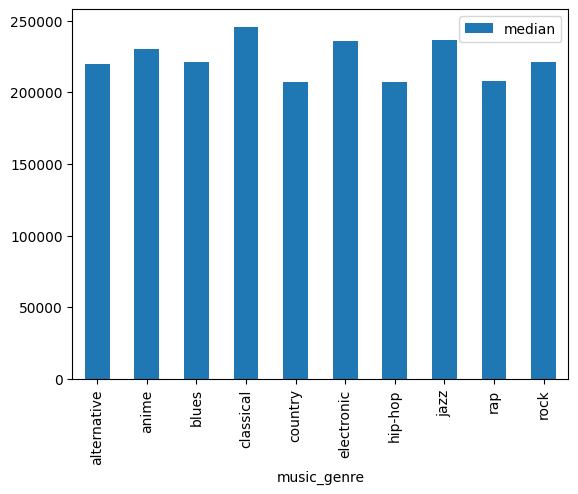

In [28]:
create_pivot_table(data, 'music_genre', 'duration_ms')

Из гистограммы видно, что медианное значение параметра находится примерно на одном уровне у каждой категории. Однако среди максимальных значений у категорий можно найти отличия:  
1. Категория `electronic` имеет самое большое максимальное значние 4497994 мс. Результат очень сильно отличается от других катекорий. Однако, возможно, это выброс и стоит проверить это
2. Категории `anime`, `blues`, `classica`, `jazz` имеею максимальную продолжительность более 1000000 мс. Однако данные в этих категория также стоит проверить на выбросы.  
3. Остальные катеригии имеют максимальное значение менее 1000000 мс  
  
Также стоит отбратить внимание на то, что во всех категориях минимальное значение составляет -1. Так как Мы исследуем признак `продолжительность в мс`, то таких значение быть не может. Следовательно, значние -1 появилось в результате ошибки или технического сбоя. Семплы, которые содержат это значение нужно либо удалить, либо заменить значение чем-либо другим.

Посмотрим, какое количество семплов имеет отрицательное значение данного критерия. Также проверим, принимает ли данные признак другие отрицательные значения

In [38]:
df_temp = data.query('duration_ms <= 0')
df_temp['duration_ms'].unique()

array([-1.])

In [39]:
df_temp['duration_ms'].count()

1840

In [40]:
df_temp.groupby('music_genre')['duration_ms'].count()

music_genre
alternative    249
anime          162
blues          235
classical      123
country        201
electronic     229
hip-hop        109
jazz           106
rap            230
rock           196
Name: duration_ms, dtype: int64

Можно заметить, что из отрицательных значений данные признак принимает только значение -1. Таких семплов в датасете 1840 и содержатся они во всех категориях

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


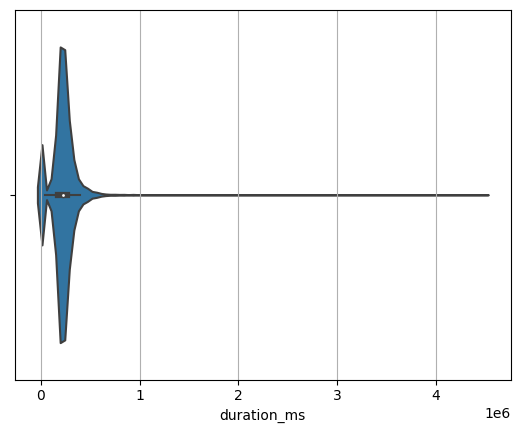

In [41]:
create_violinplot(data, 'duration_ms')

Распределение похоже на нормальное с длинным правы хвостом. Видно, что признако содержит много уникальных значений, которые с высокой долей вероятности являются выбросами. Также около 0 наблюдается еще один небольшой пик.  
Чтобы подробнее изучить распределение данного параметра, сгруппируем данные по категориям и для каждой категории построим такой же график

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

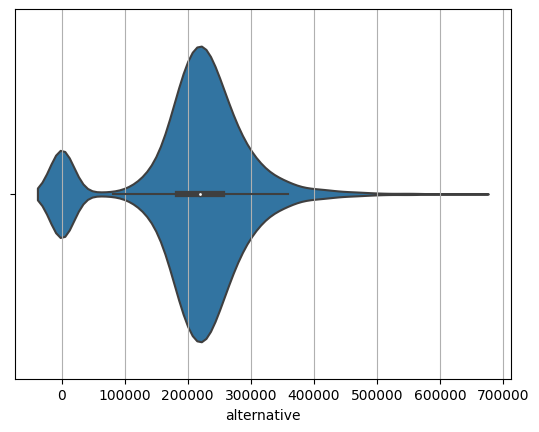

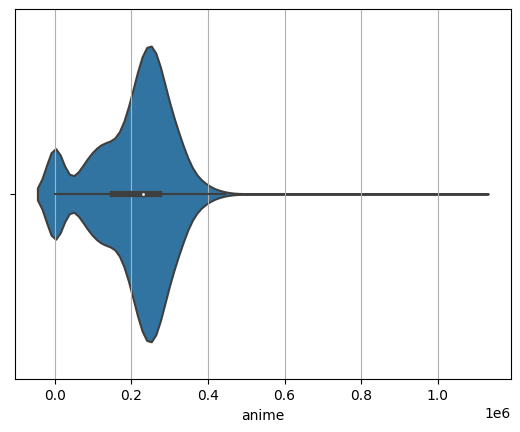

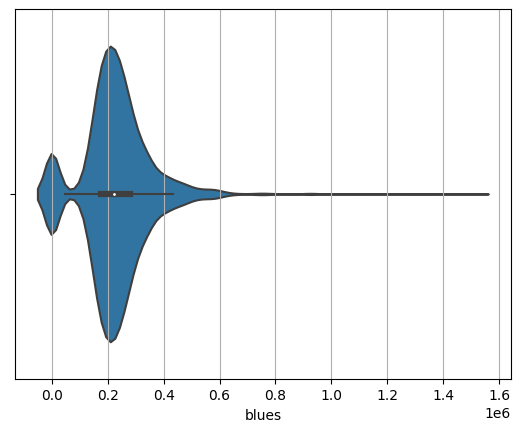

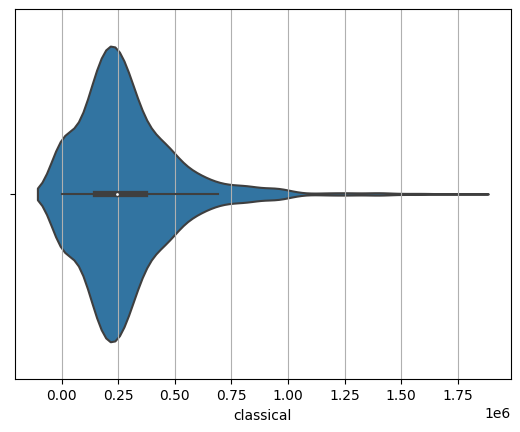

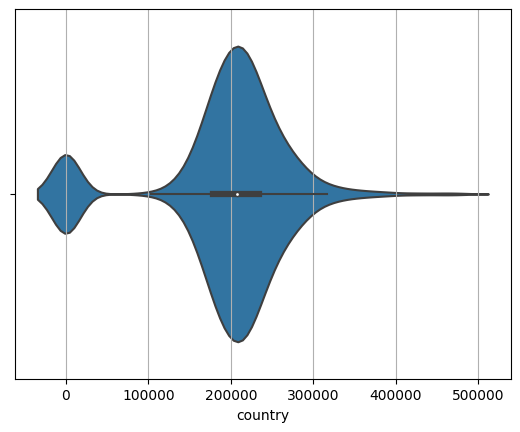

...

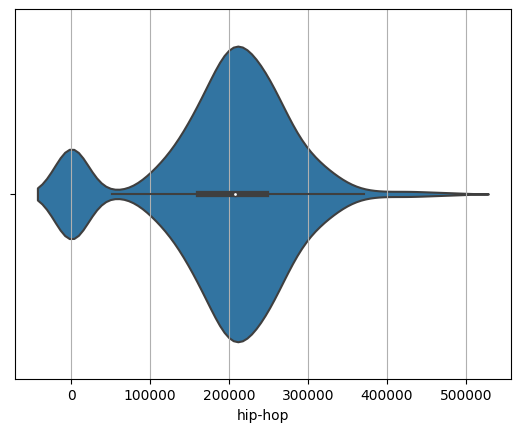

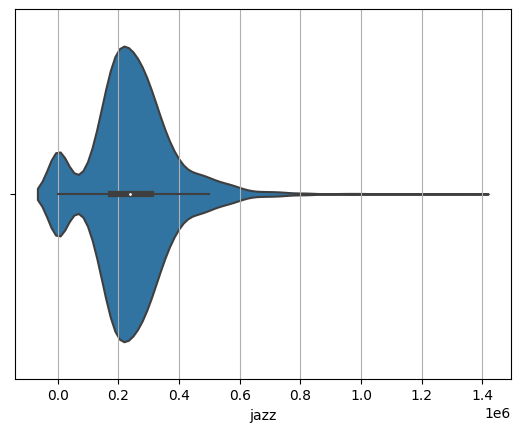

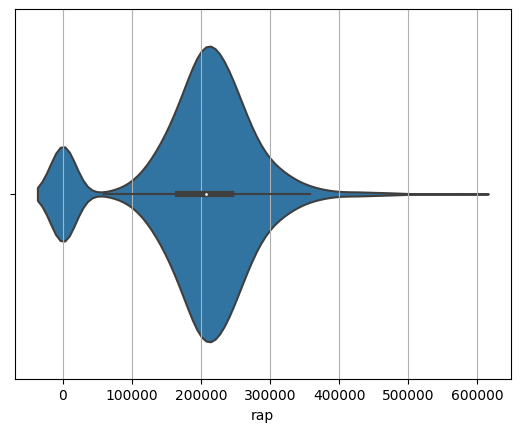

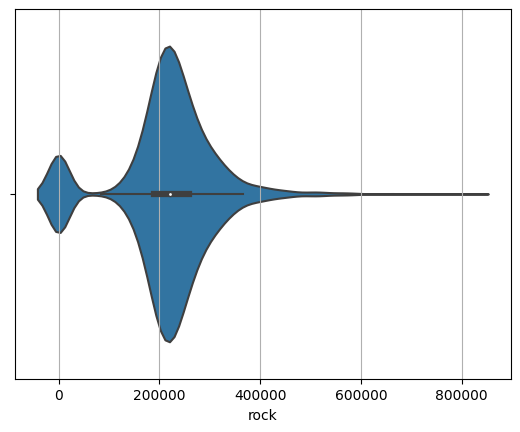

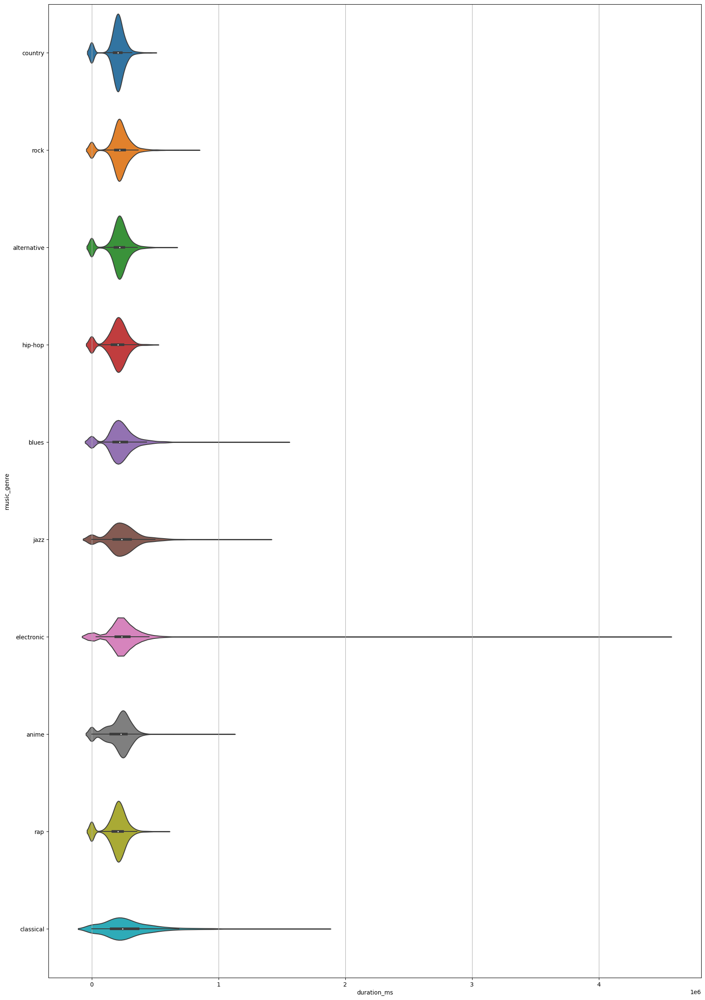

In [43]:
create_category_violinplot(data, 'music_genre', 'duration_ms', True)

Из графиков видно, что распределения для каждой категории очень похожи. Основное отличие заключется в правом хвосте распределения. Дополнительно посмотрим на правый хвост распределения признака. Для этого постороим гистограмму для значений более 800.000. Также посомтрим на всплеск около 0. Скорее всего, там находятся семплы со значением -1. Построим гистограмму для значений менее 100.000

array([[<Axes: title={'center': 'duration_ms'}>]], dtype=object)

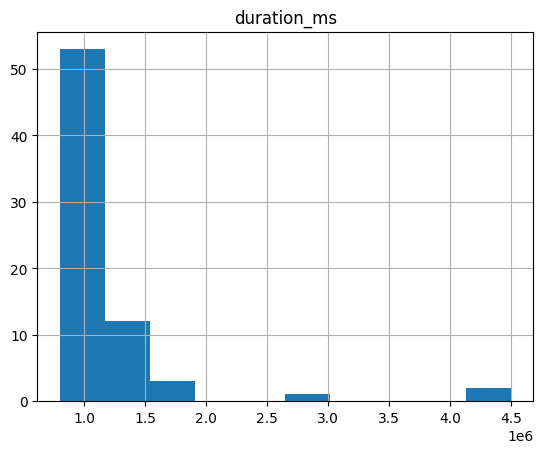

In [52]:
data.query('duration_ms > 800000').hist('duration_ms')

array([[<Axes: title={'center': 'duration_ms'}>]], dtype=object)

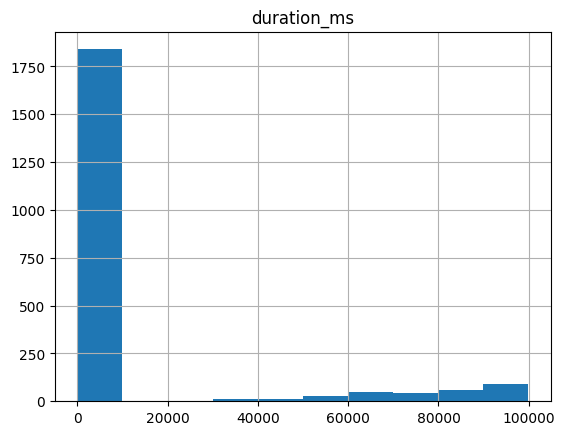

In [50]:
data.query('duration_ms < 100000').hist('duration_ms')

Из первого графика видно, что в правом хвосте есть небольшое количество семплов.  
Из второго графика видно, что действительно всплеск около 0 обусловлен семплами со значением -1.

## 3.6. <a id='toc3_6_'></a>[energy - энергичность](#toc0_)

In [53]:
data['energy'].describe()

count    18754.000000
mean         0.625431
std          0.251477
min          0.001010
25%          0.470000
50%          0.666000
75%          0.831000
max          0.999000
Name: energy, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,0.711080,0.7505,0.05560,0.997
anime,0.673693,0.7970,0.00243,0.999
blues,0.616768,0.6380,0.00957,0.998
classical,0.173382,0.1000,0.00101,0.990
country,0.636066,0.6670,0.04270,0.981
electronic,0.738202,0.7710,0.02110,0.999
hip-hop,0.645995,0.6535,0.19900,0.995
jazz,0.471676,0.4710,0.01410,0.990
rap,0.651763,0.6500,0.07930,0.995


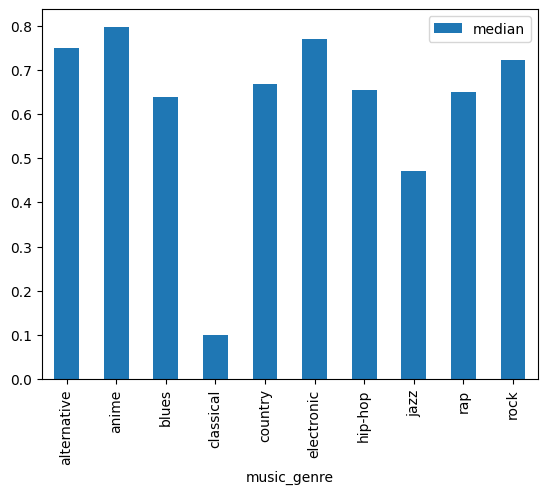

In [54]:
create_pivot_table(data, 'music_genre', 'energy')

Из сводно таблицы и гистограммы видно, что выделяются следующие классы:
1. `classical` - данная категория имеет самое маленькое значение данного параметра. Причем оно значительно меньше остальных
2. Категории `alternative`, `anime`, `electronic`, `rock` имеют значение медианы данного параметра больше 0.7 (0.7505, 0.7970, 0.738202, 0.7220 соответственно)

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


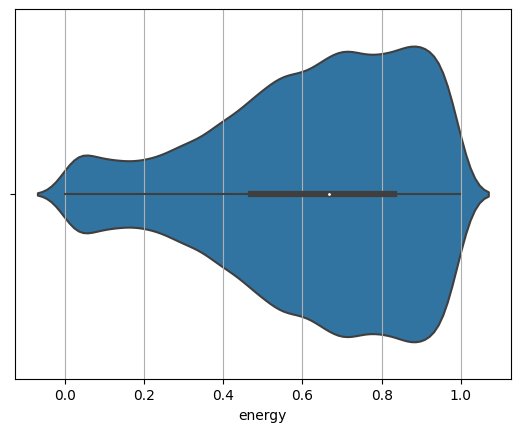

In [57]:
create_violinplot(data, 'energy')

Из графика видно, что распределение скошено влево. Для более подробного изучения данного параметра построим его распределение по категориям

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

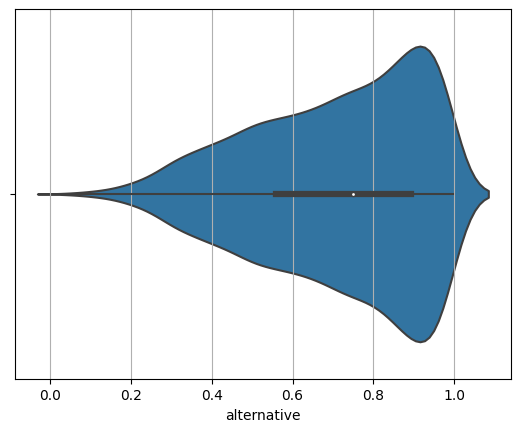

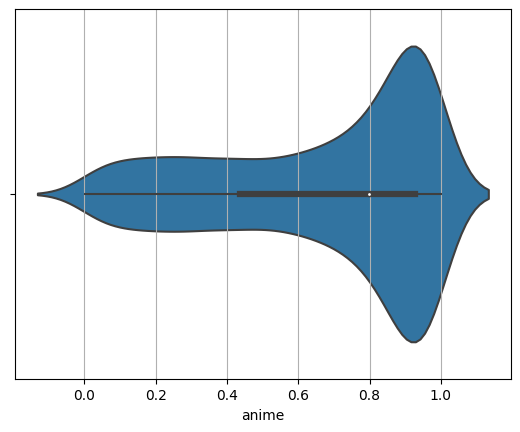

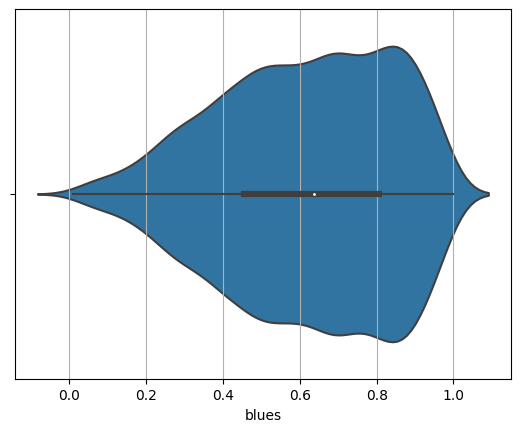

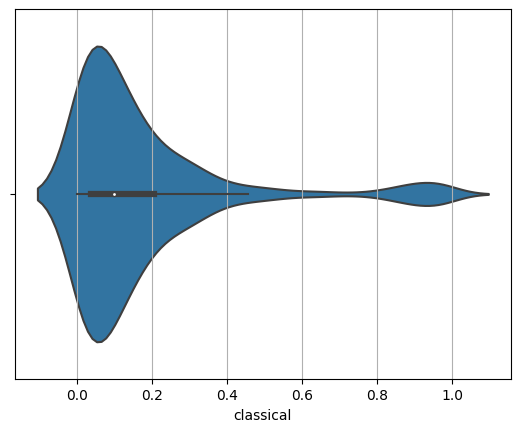

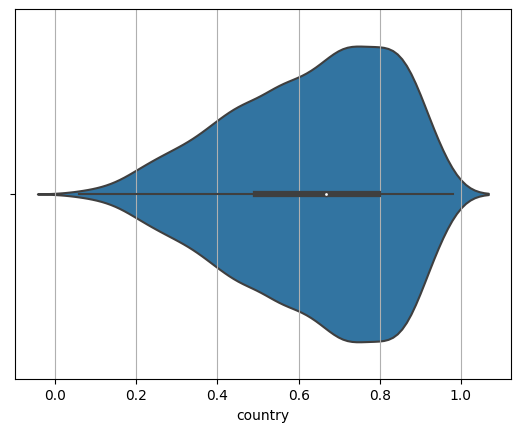

...

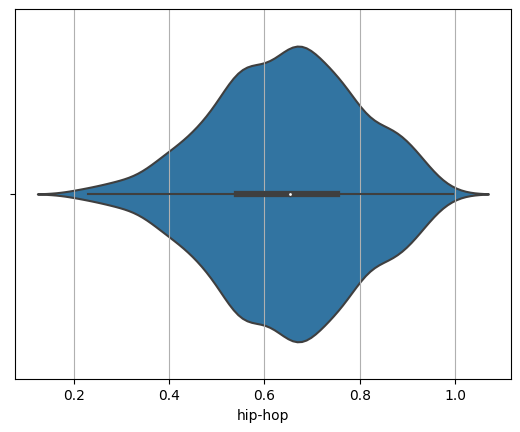

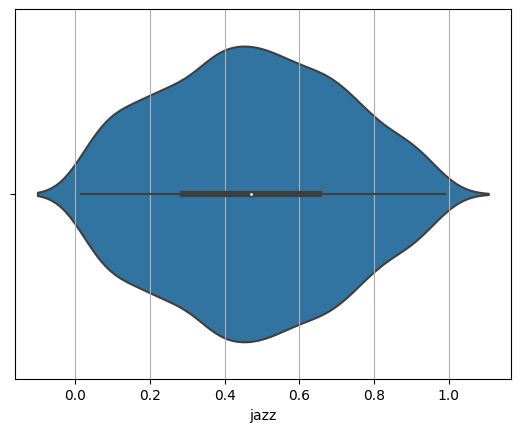

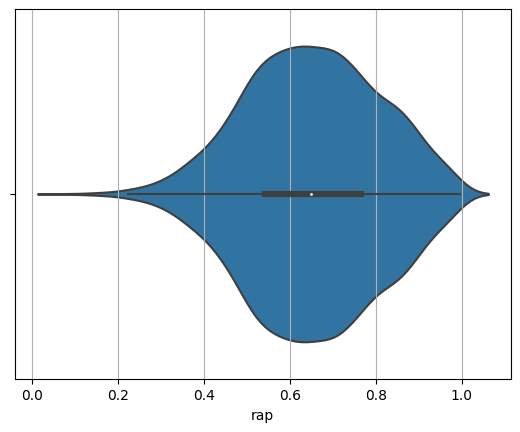

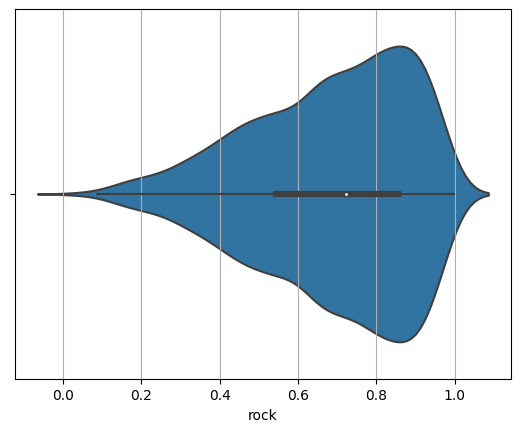

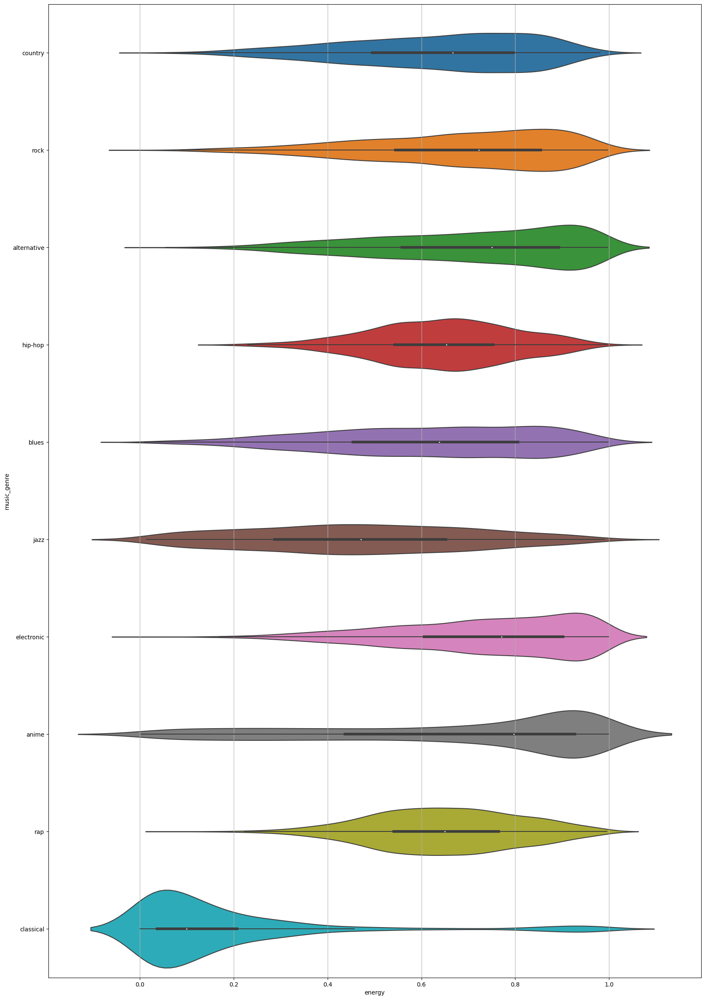

In [59]:
create_category_violinplot(data, 'music_genre', 'energy', True)

На данных графиках можно заметить следующие особенности:
1. Распределение `classical` очень сильно отличается от остальных.
2. Распределения `anime`, `electronic`, `blues`, `alternative`, `rock`, `country` имеют скошенное влево распределение. Причем у категории `anime` самый сильный скос
3. Остальные категории имеют распределение похожее на нормальное и скоса не имеют

## instrumentalness - инструментальность

In [60]:
data['instrumentalness'].describe()

count    18754.000000
mean         0.160718
std          0.307244
min          0.000000
25%          0.000000
50%          0.000146
75%          0.085700
max          0.996000
Name: instrumentalness, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,0.062033,0.000064,0.0,0.931
anime,0.271038,0.000261,0.0,0.996
blues,0.092925,0.001010,0.0,0.961
classical,0.598319,0.837000,0.0,0.987
country,0.004863,0.000001,0.0,0.778
electronic,0.349890,0.178000,0.0,0.986
hip-hop,0.010386,0.000000,0.0,0.923
jazz,0.362112,0.131000,0.0,0.975
rap,0.008388,0.000000,0.0,0.922


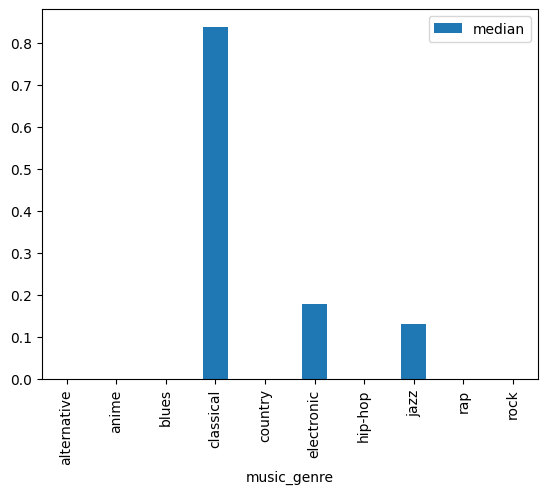

In [61]:
create_pivot_table(data, 'music_genre', 'instrumentalness')

Из сводной таблицы и гистограммы видно, что категория `classical` больше всего выделяется в данном признаке. Медианное значение в данной категории равно 0.837. Категории `electronic` и `jazz` имеют значения медианы 0.178 и 0.131 соответственно. У остальных категорий медиана данного признакак практически равна 0

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


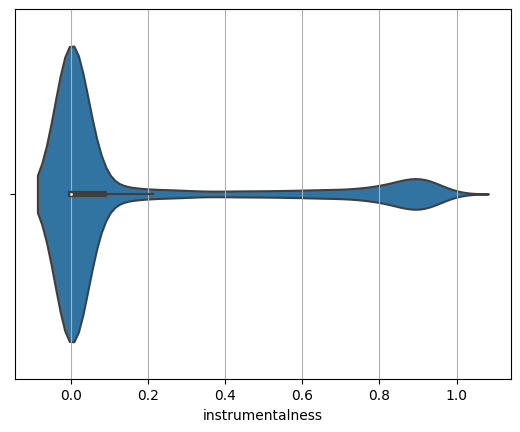

In [62]:
create_violinplot(data, 'instrumentalness')

Данный график подтверждает выводы, сделанные из гистограммы и сводной таблицы - практически все семплы сконцентрированы около 0. Всплеск около 1, скорее всего, представлен категорией `classical`. Чтобы узнать более подробную информацию построим распределение данного признака по категориям

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

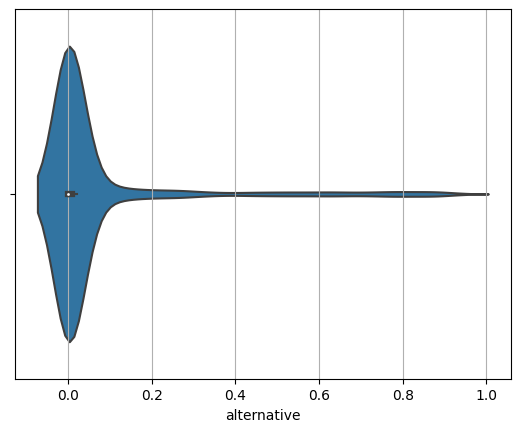

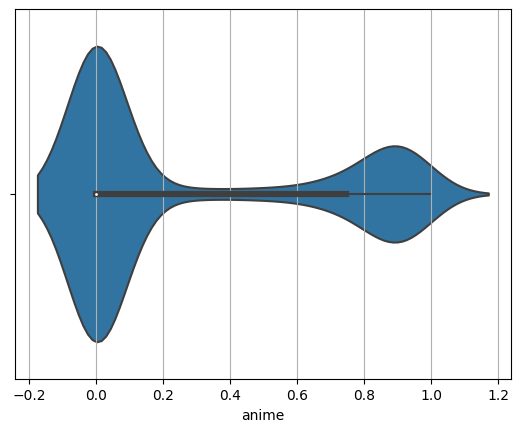

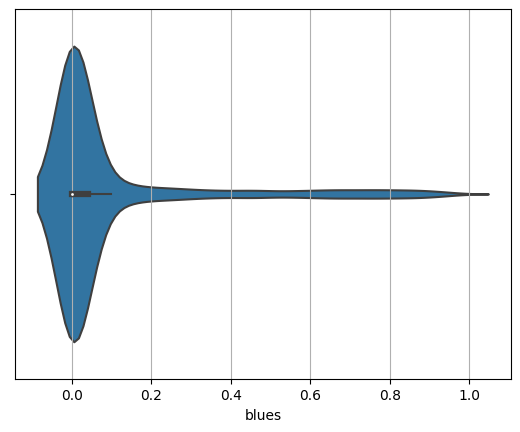

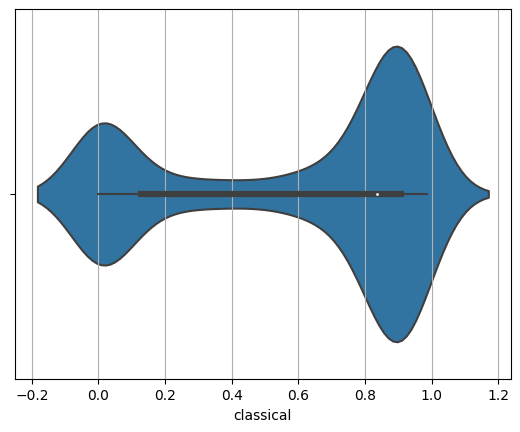

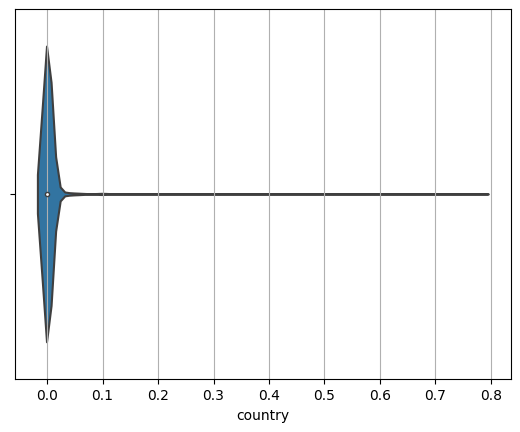

...

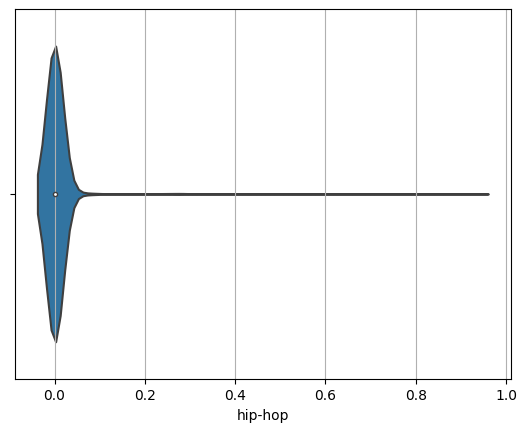

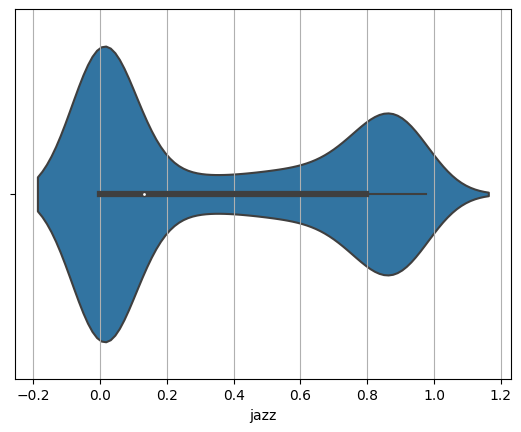

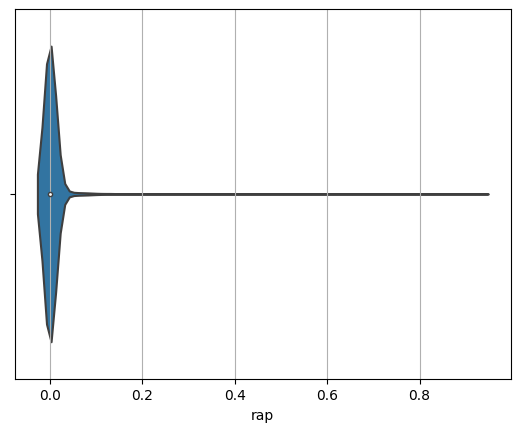

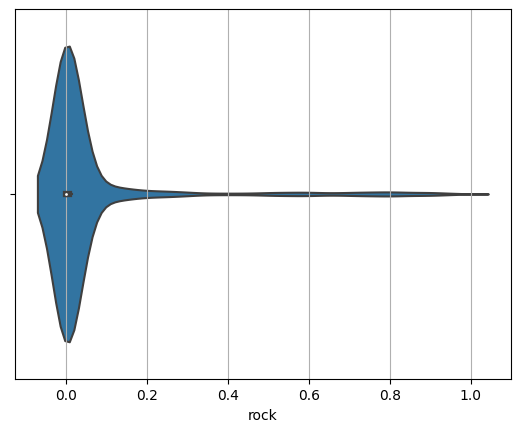

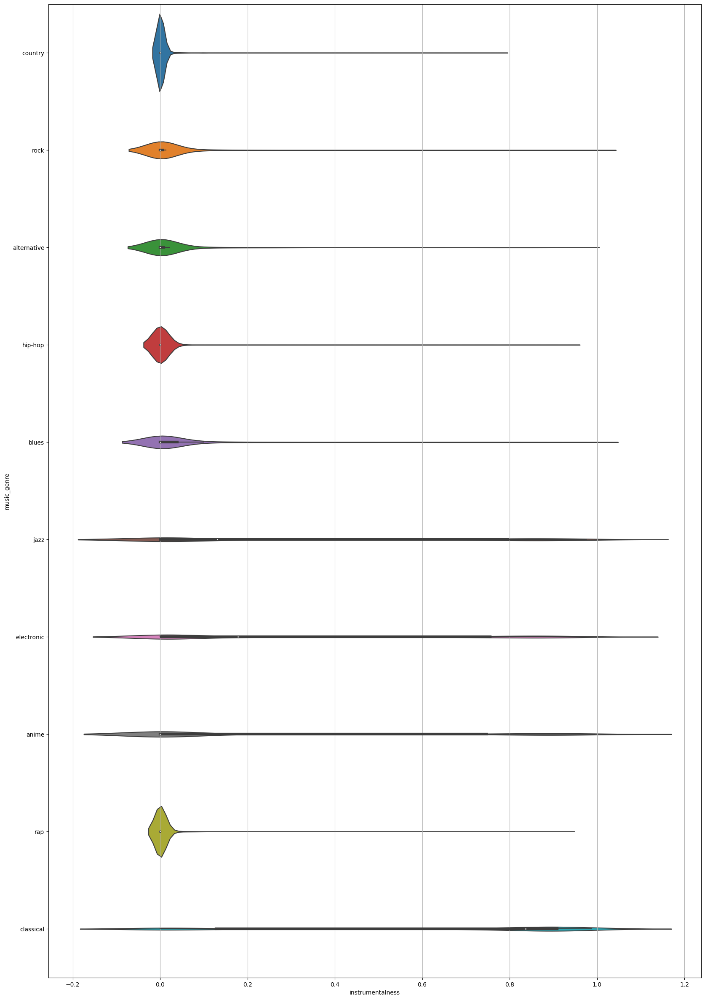

In [64]:
create_category_violinplot(data, 'music_genre', 'instrumentalness', True)

Полученные графики отражают следующие особенности:
1. Категории `alternative`, `blues`, `country`, `hip-hop`, `jazz`, `rap`, `rock` имеют практическу нулевую инструментальность.
2. Категория `classical` единсвенно имеет основной всплеск около 1. Но также имеет всплеск около 0.
3. Категории `electronic` и `jazz` наоборот имеют основную вершину около 0 и еще одну небольшую вершину около 1.

## liveness - привлекательность

In [71]:
data['liveness'].describe()

count    18754.000000
mean         0.198873
std          0.166665
min          0.013600
25%          0.097400
50%          0.130000
75%          0.254000
max          1.000000
Name: liveness, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,0.199319,0.136,0.0212,0.996
anime,0.196737,0.140,0.0169,0.943
blues,0.236436,0.142,0.0136,1.000
classical,0.167823,0.111,0.0365,0.979
country,0.183775,0.129,0.0212,0.982
electronic,0.208284,0.128,0.0194,0.952
hip-hop,0.200065,0.137,0.0278,0.950
jazz,0.172923,0.116,0.0291,0.979
rap,0.197061,0.134,0.0241,0.962


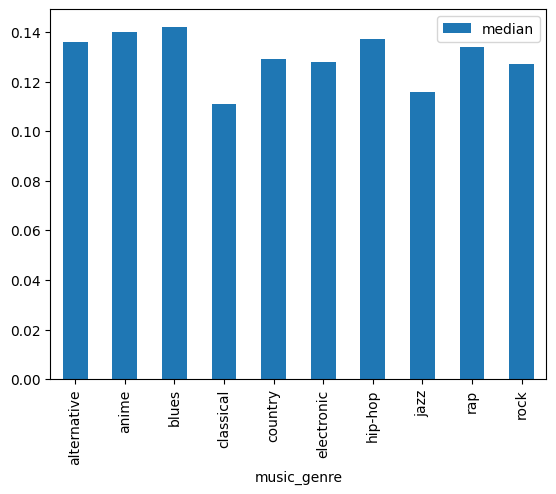

In [72]:
create_pivot_table(data, 'music_genre', 'liveness')

Из сводной таблицы и гистограммы видно, что категории `classical` и `jazz` имеют наименьшее значение медианы данного признака. Остальные категории имеют примерно одинаковые значения медианы

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


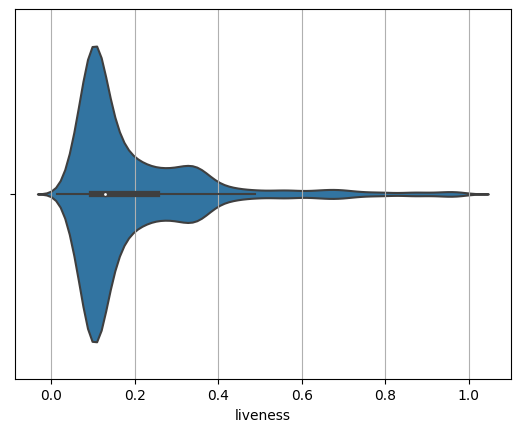

In [73]:
create_violinplot(data, 'liveness')

Из графика видно несколько вершин. Основная около 0.15, поменьше около 0.35 и 2 совсем малеькие. Для получения более подробной информации построим распределение данного признака по категориям

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

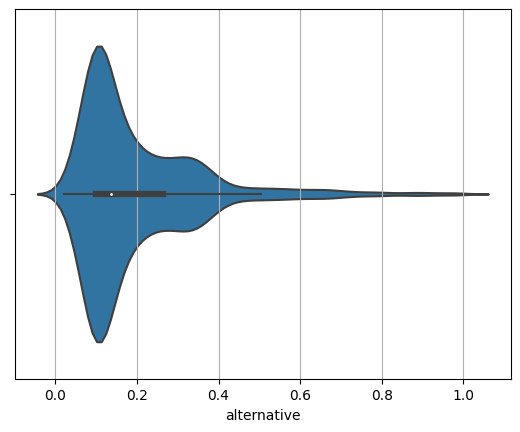

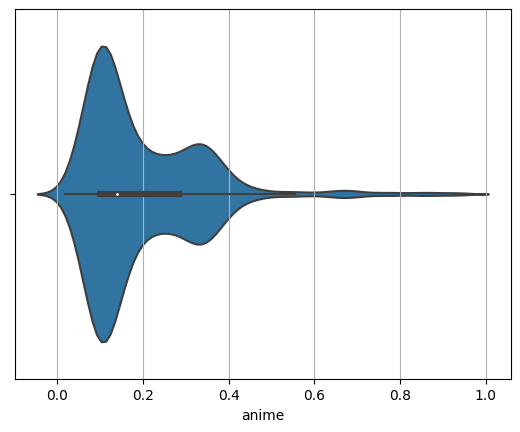

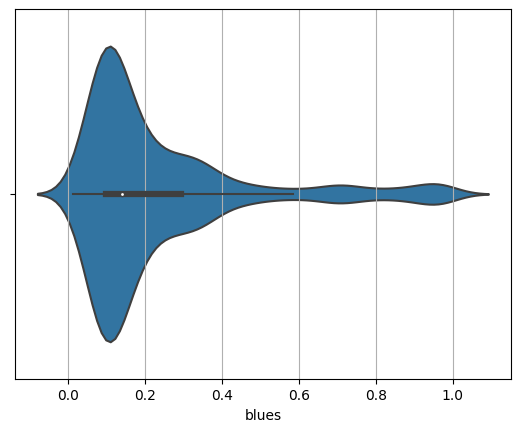

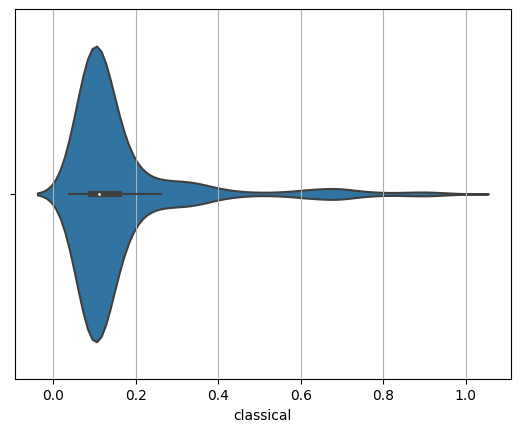

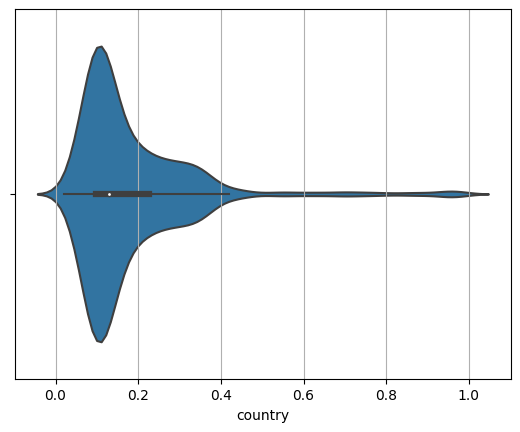

...

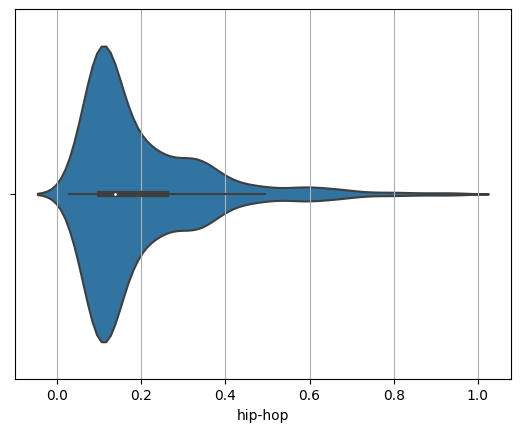

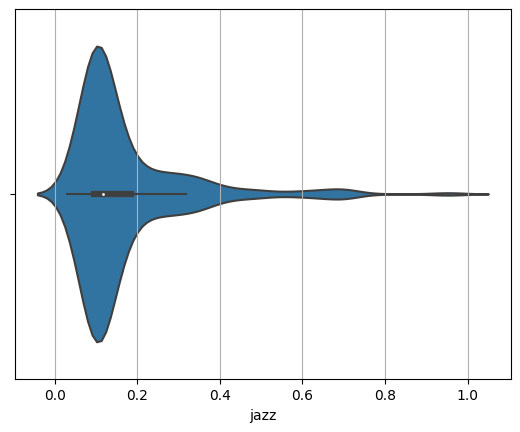

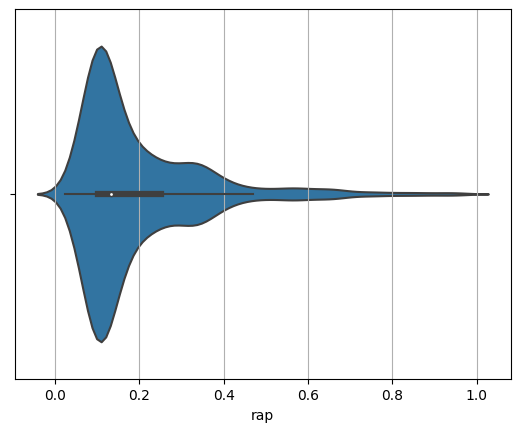

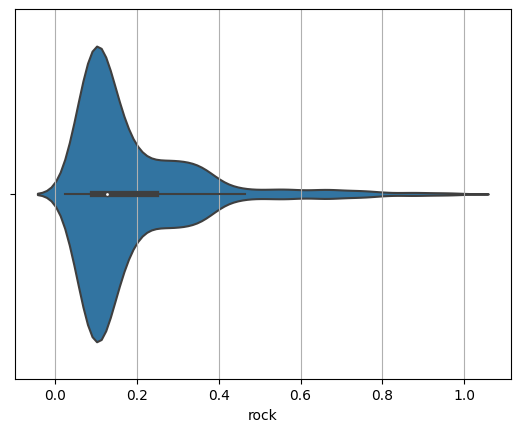

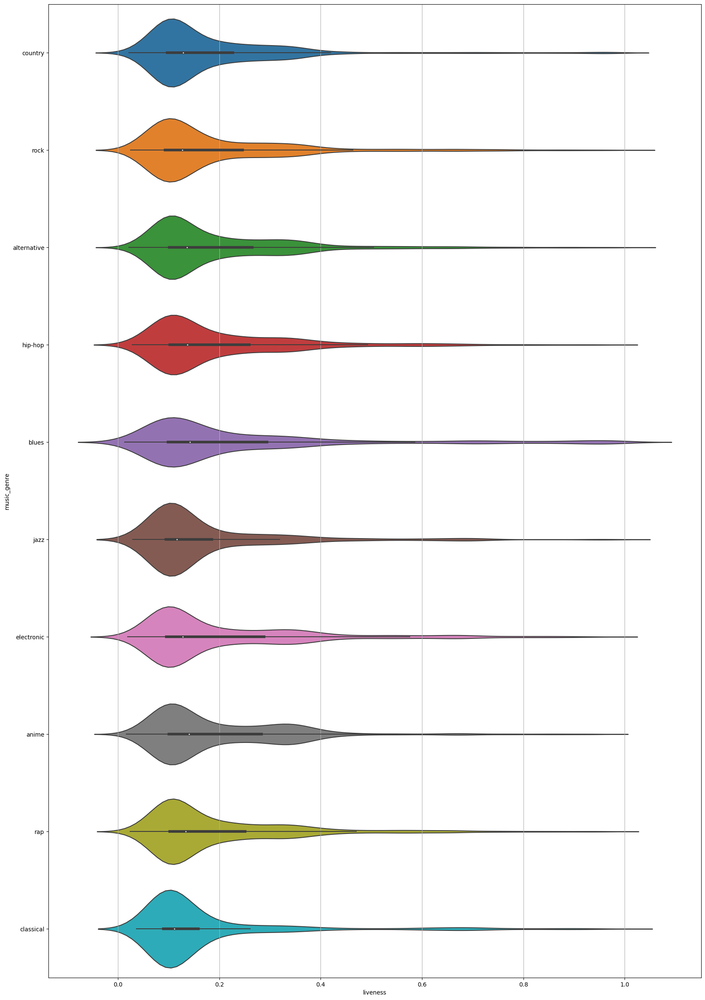

In [75]:
create_category_violinplot(data, 'music_genre', 'liveness', True)

У всех категорий распределение данного признака очень похожи. Из особенностей можно выделить наиболее выраженную вторую вершину и категории `anime`

## loudness - громкость

In [76]:
data['loudness'].describe()

count    18754.000000
mean        -8.553494
std          5.505285
min        -44.406000
25%        -10.254750
50%         -7.044000
75%         -5.052250
max          3.744000
Name: loudness, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,-6.555592,-6.0455,-20.741,-0.259
anime,-7.815908,-5.6180,-38.833,0.359
blues,-8.912977,-8.4000,-25.243,3.744
classical,-21.601275,-21.9570,-44.406,-3.358
country,-7.310515,-6.4925,-27.119,-1.723
electronic,-7.008500,-6.4040,-24.798,0.899
hip-hop,-6.838716,-6.5875,-25.602,-0.898
jazz,-11.311024,-10.3895,-29.709,-1.163
rap,-6.657605,-6.3145,-22.589,-1.020


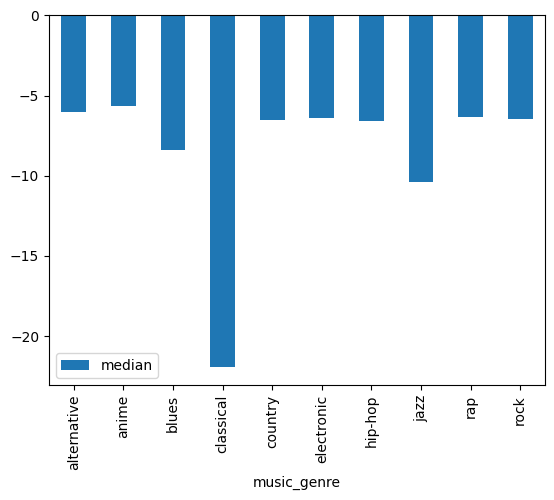

In [77]:
create_pivot_table(data, 'music_genre', 'loudness')

Из сводной таблицы и гистораммы видно, что наиболее выделяются категории `classical`, `jazz`, `blues`. Остальные категории имеют примерно одинаковое значение медианы признака

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


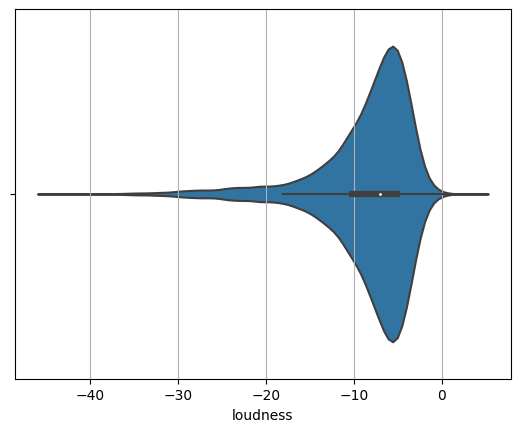

In [78]:
create_violinplot(data, 'loudness')

Из графика видно, что мат ожидание распределение находится около -5 и имеется длинный левый хвост. Построим распределение по категориям

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

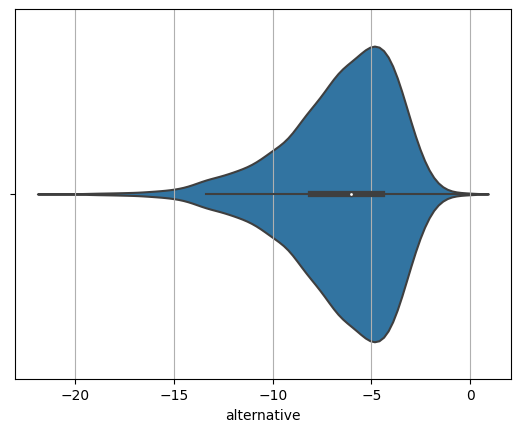

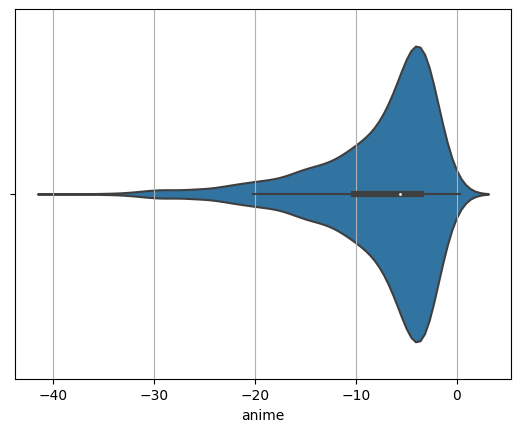

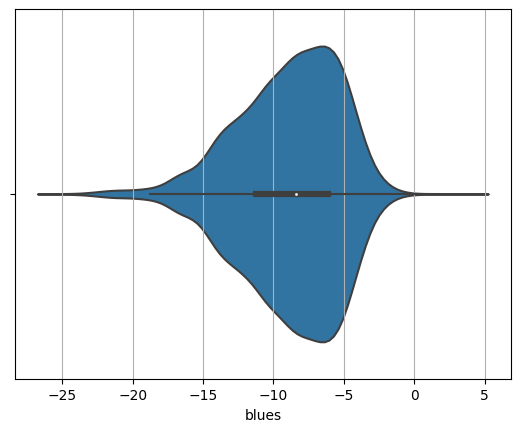

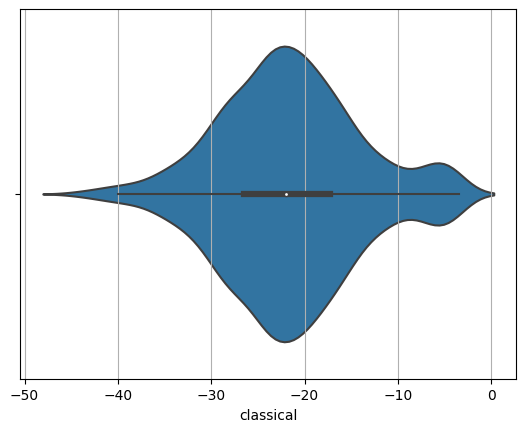

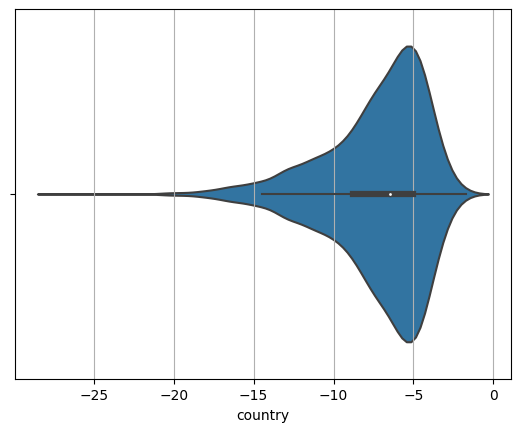

...

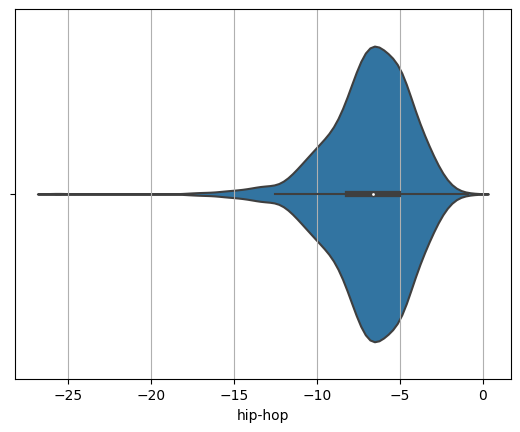

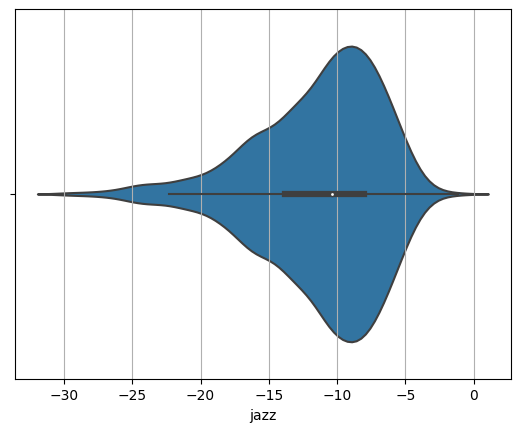

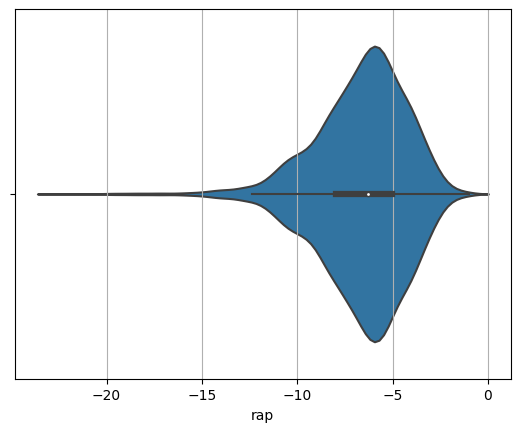

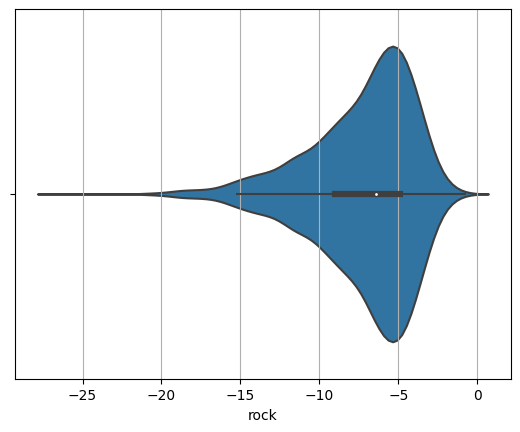

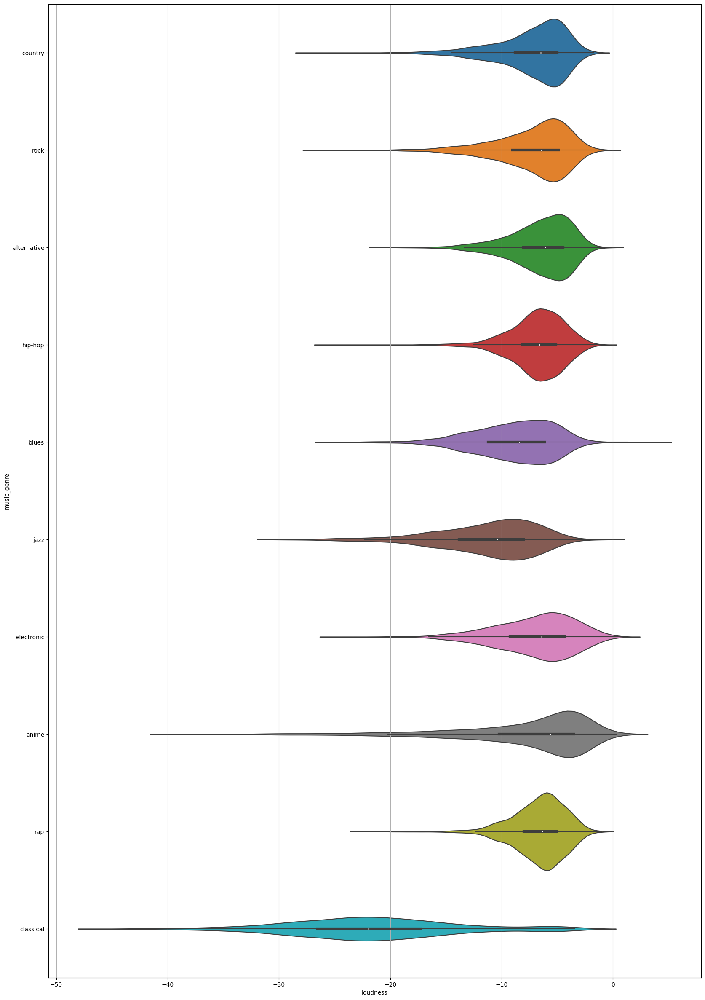

In [80]:
create_category_violinplot(data, 'music_genre', 'loudness', True)

Данный график подтверждает выводы, полученные из сводной таблицы и гистограммы. Для всех категорий, кроме `classical` позожи. Распределения для категорий `jazz` и `blues` похожи на остальные, но имеют меньшее мат ожидание и поэтмоу смещены влево

## speechiness - выразительность

In [82]:
data['speechiness'].describe()

count    18754.000000
mean         0.091178
std          0.097573
min          0.022300
25%          0.035600
50%          0.048950
75%          0.094900
max          0.932000
Name: speechiness, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,0.090044,0.0535,0.0232,0.869
anime,0.064464,0.0454,0.0229,0.498
blues,0.061243,0.0432,0.0231,0.812
classical,0.052710,0.0433,0.0244,0.631
country,0.050037,0.0341,0.0223,0.689
electronic,0.099664,0.0574,0.0242,0.739
hip-hop,0.208796,0.1955,0.0260,0.932
jazz,0.070369,0.0435,0.0230,0.714
rap,0.186517,0.1600,0.0229,0.922


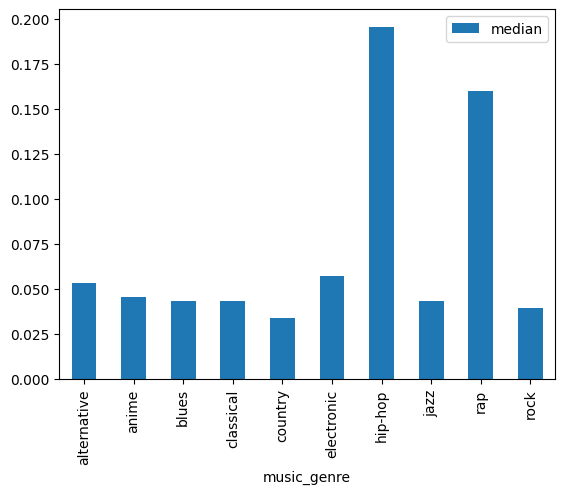

In [83]:
create_pivot_table(data, 'music_genre', 'speechiness')

Из свобной таблицы и гистограммы видно, что категории `hip-hop` и `rap` сильно выделяются из остальных. Их значение медианы данного признака сильно больше, чем у остальных категорий (0.1955 для `hip-hop` и 0.16 для `rap`)

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


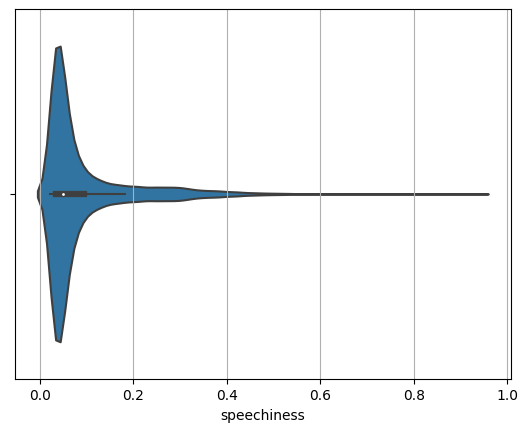

In [84]:
create_violinplot(data, 'speechiness')

Из графика видно, что мат ожидание распределения признака находится около 0. Для получения более подробной информации построим такой график для каждой категории

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

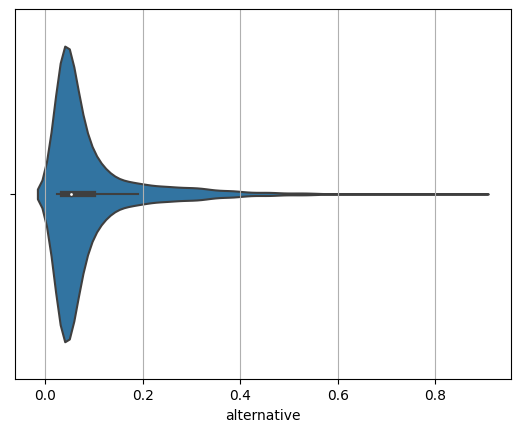

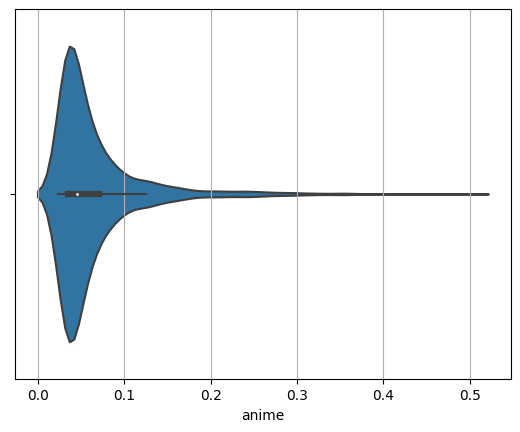

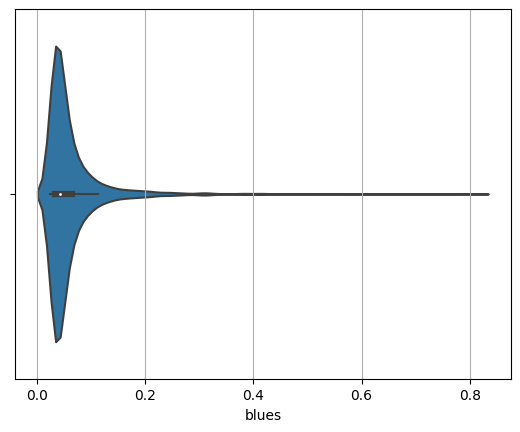

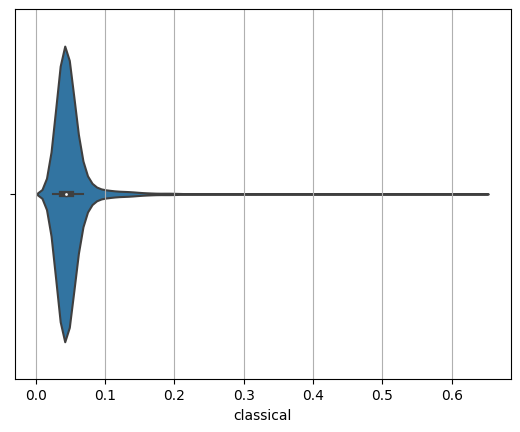

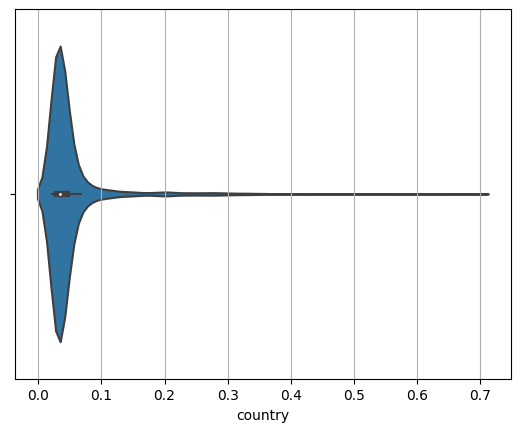

...

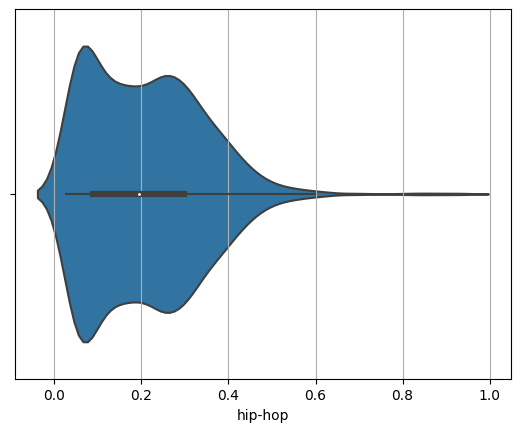

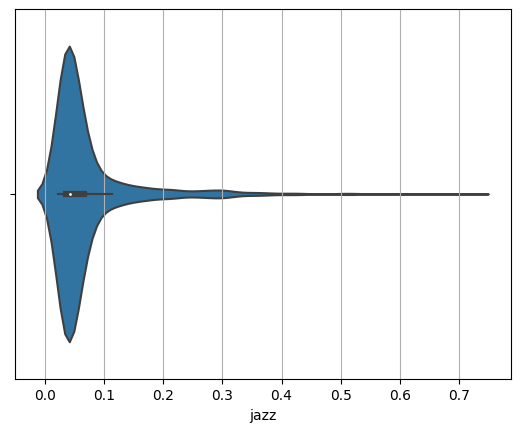

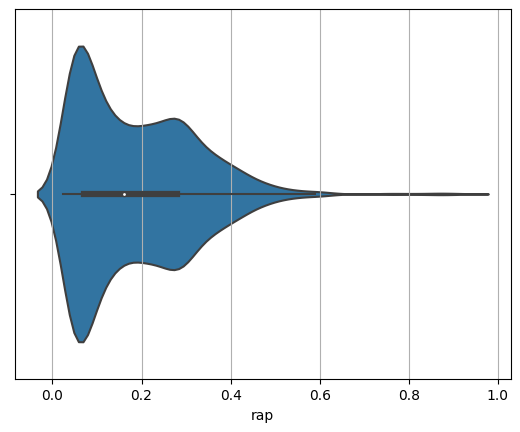

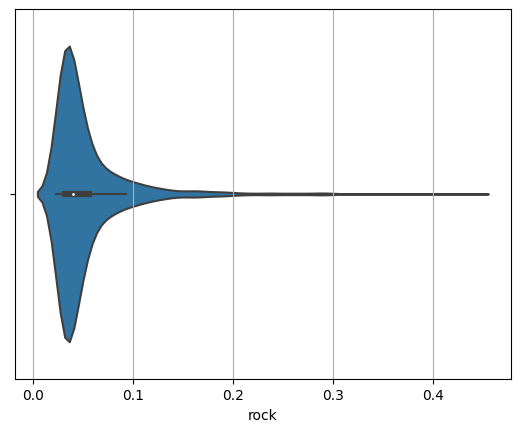

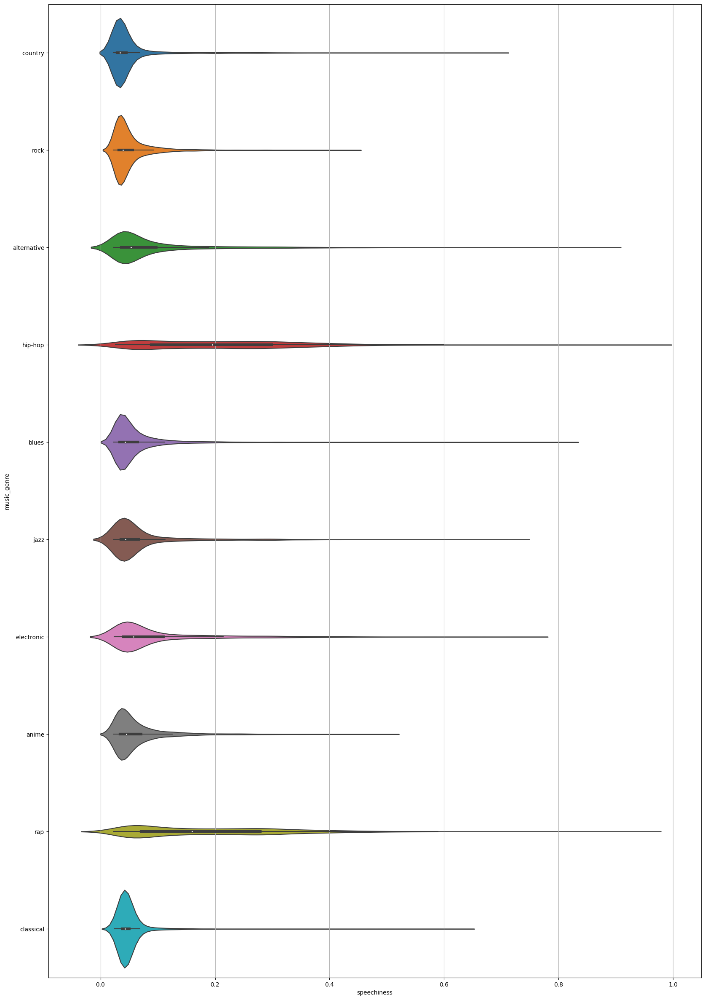

In [86]:
create_category_violinplot(data, 'music_genre', 'speechiness', True)

Из графиков видно, что распределения для всех категорий, кроме `hip-hop` и `rap` очень похожи между собой. Распределения для категорий `hip-hop` и `rap` очень похожи между собой - они имеют 2 вершины.

## tempo - темп

In [87]:
data['tempo'].describe()

count    18754.000000
mean       120.929143
std         30.423797
min         34.765000
25%         95.937250
50%        120.011000
75%        141.949000
max        220.041000
Name: tempo, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,122.983862,120.0520,51.316,212.137
anime,126.668986,128.0300,47.704,207.867
blues,121.383258,119.1180,47.587,215.918
classical,102.980021,95.4190,34.856,207.863
country,122.920794,121.5350,58.095,208.307
electronic,126.557267,126.0010,54.951,220.041
hip-hop,120.719383,120.7745,47.917,207.852
jazz,111.415939,105.2670,34.765,208.072
rap,119.966410,120.0305,47.811,206.247


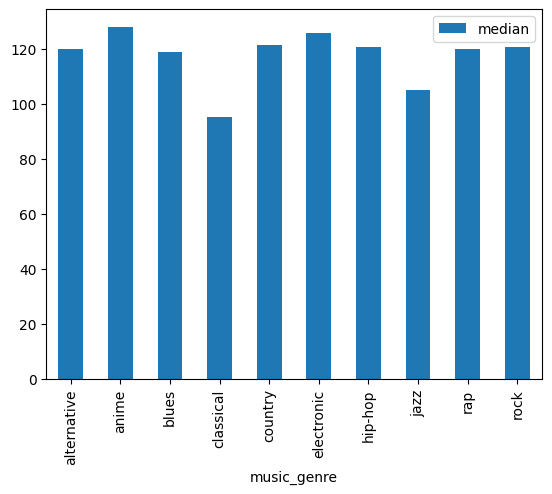

In [89]:
create_pivot_table(data, 'music_genre', 'tempo')

Из сводной таблицы и гистограммы видно, что наименьшую медиану темпа имеют категории `classical` и `jazz` (95.4190 и 105.267) соответственно. Остальные категории имеют примерно равную медиану темпа

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


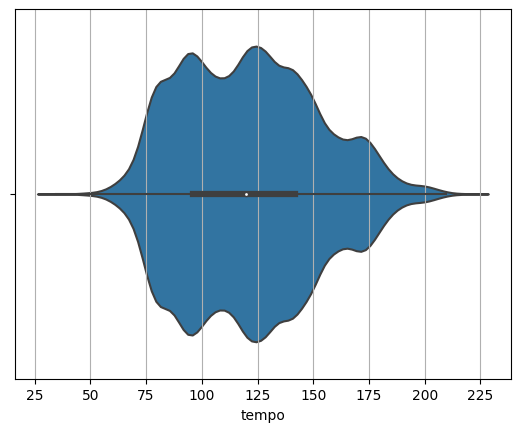

In [91]:
create_violinplot(data, 'tempo')

Из графика видно, что распрееделение признака имеет 3 выраженные вершины. Построим распределение признака по категория для получения более детальной информации

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

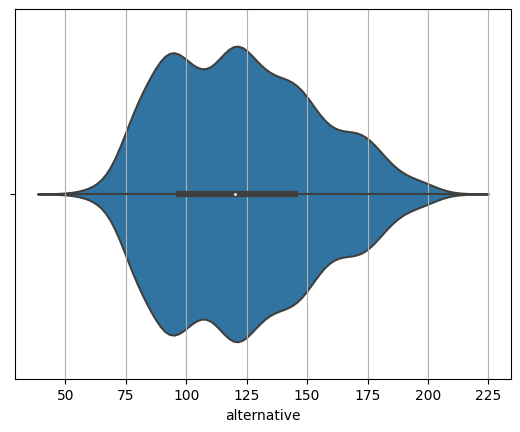

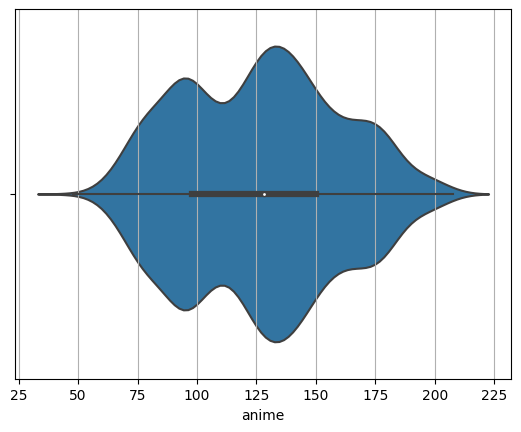

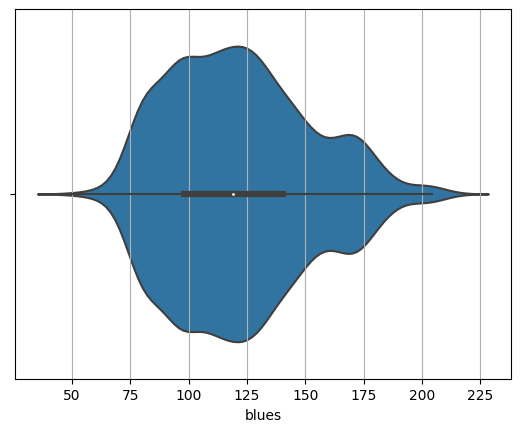

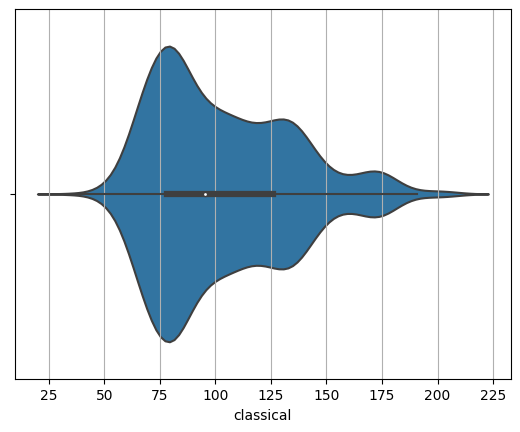

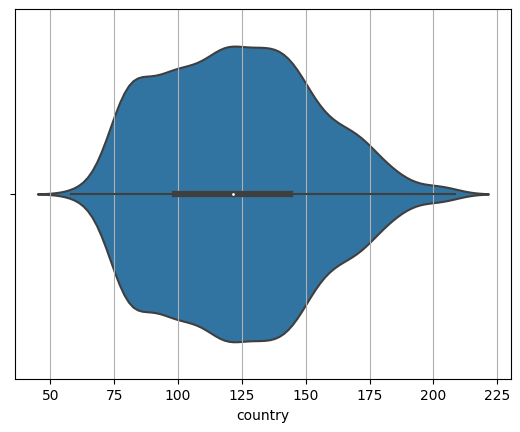

...

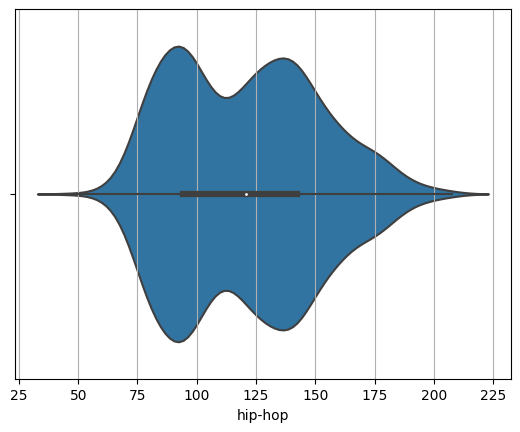

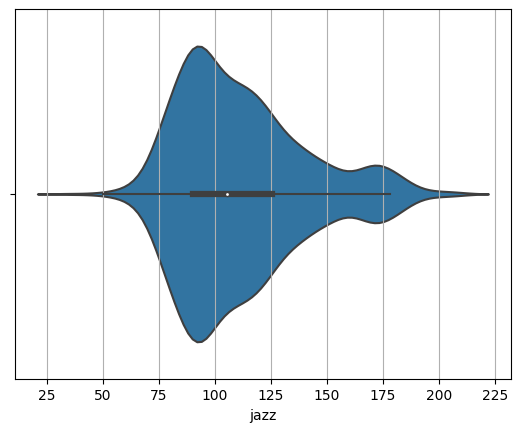

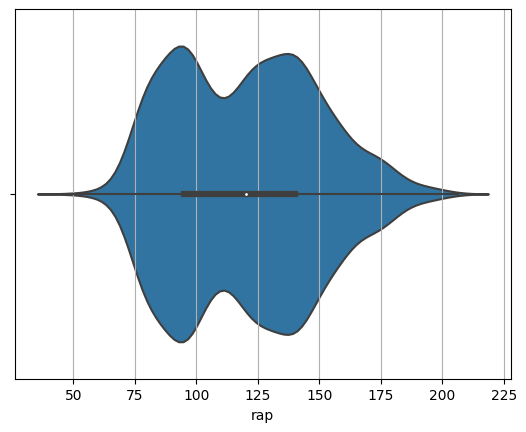

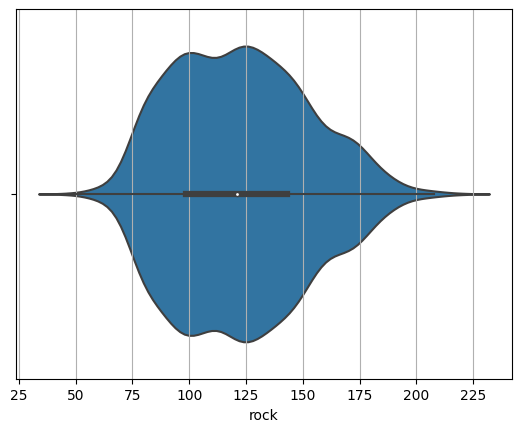

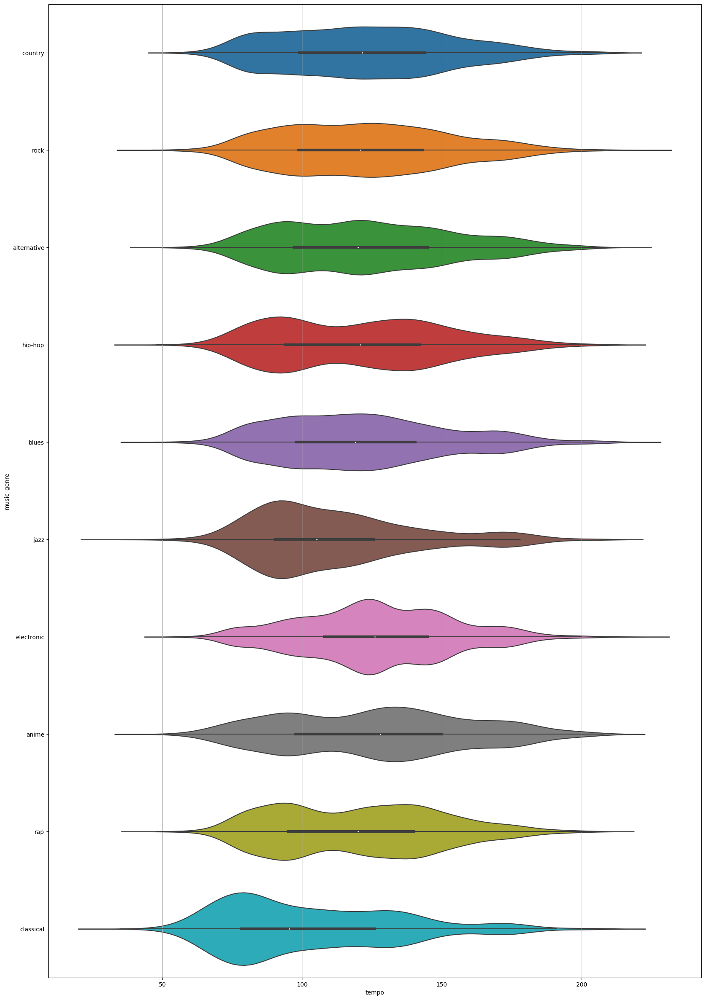

In [93]:
create_category_violinplot(data, 'music_genre', 'tempo', True)

Распределения категорий `classical` и `jazz` выделяются из другихх - одни имеют по одной вершине. Категория `electronic` имеет одну более выраженную и вторую менее выраженную вершины. Категории `blues` и `alternative` имеет одну вершину с большой дисперсией. Остальные распределения похожи между собой

valence - привлекательность произведения для пользователей сервиса

In [94]:
data['valence'].describe()

count    18754.000000
mean         0.464954
std          0.243685
min          0.000000
25%          0.272000
50%          0.457000
75%          0.654000
max          0.992000
Name: valence, dtype: float64

,mean,median,min,max
music_genre,,,,
alternative,0.448502,0.432,0.0356,0.973
anime,0.435118,0.435,0.0252,0.986
blues,0.577972,0.586,0.0315,0.985
classical,0.208411,0.138,0.0000,0.938
country,0.541813,0.532,0.0594,0.977
electronic,0.389567,0.361,0.0276,0.992
hip-hop,0.477305,0.470,0.0375,0.979
jazz,0.503568,0.516,0.0289,0.978
rap,0.458624,0.451,0.0336,0.970


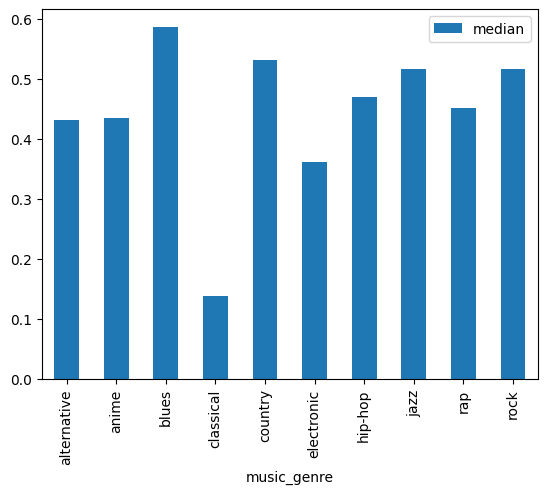

In [97]:
create_pivot_table(data, 'music_genre', 'valence')

Категория `classical` сильно выделяется из остальных. Она имеет наименьшее значение медианы признака (0.138). Также не очень высокое значение медианы имеет категория `electronic` (0.361). Категория `blues` выделятеся самым высоким значением медианы признака (0.586)

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


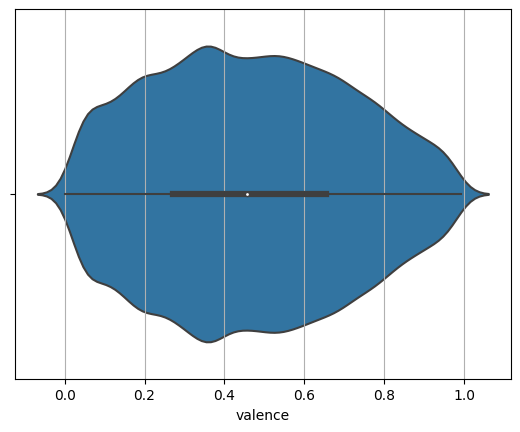

In [98]:
create_violinplot(data, 'valence')

Распределение похоже на нормальное с большое дисперсией. Построим графики по категориям

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

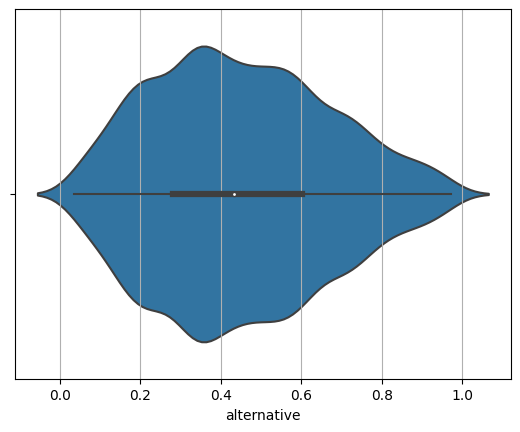

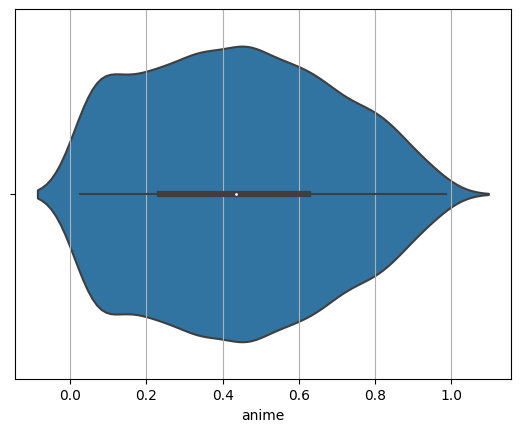

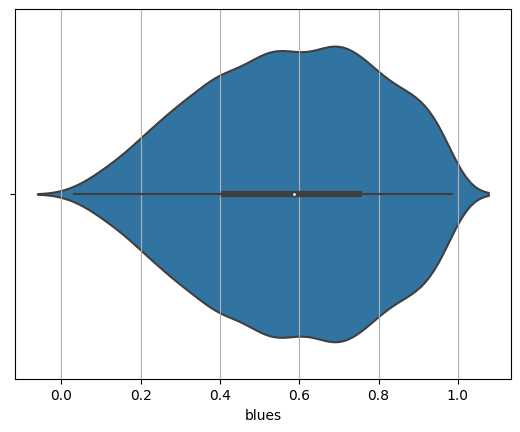

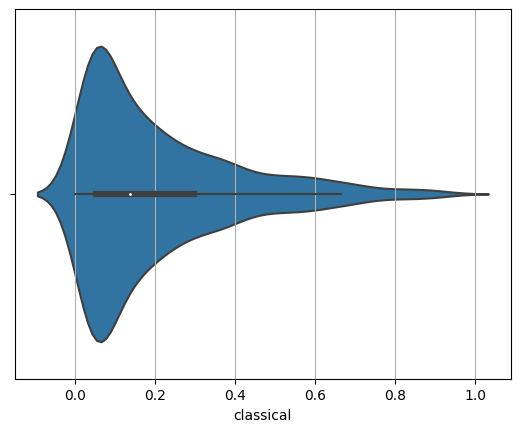

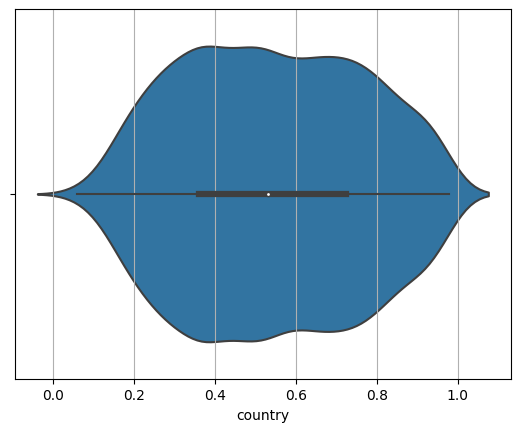

...

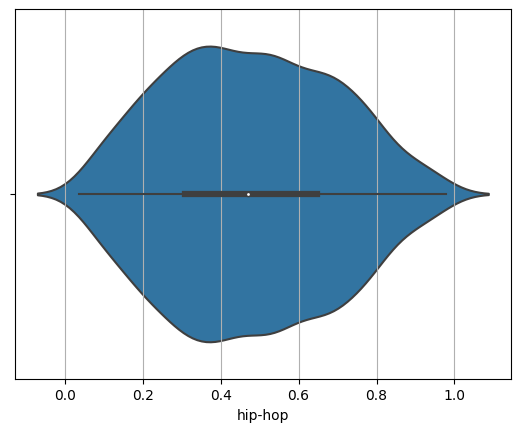

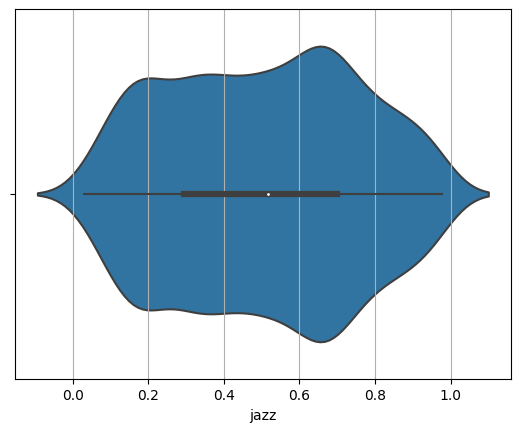

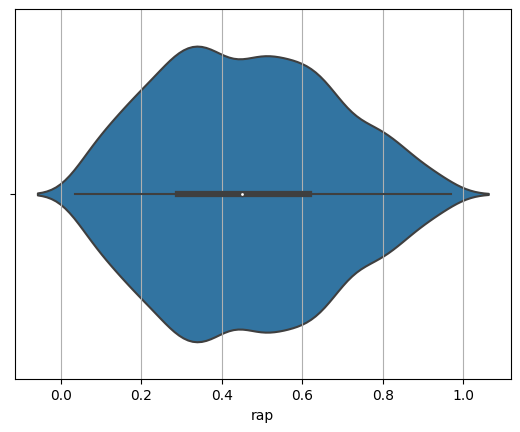

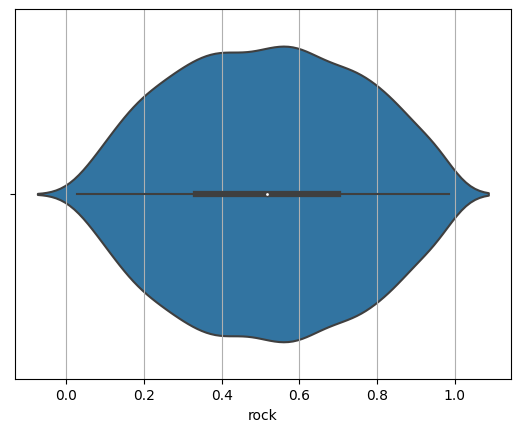

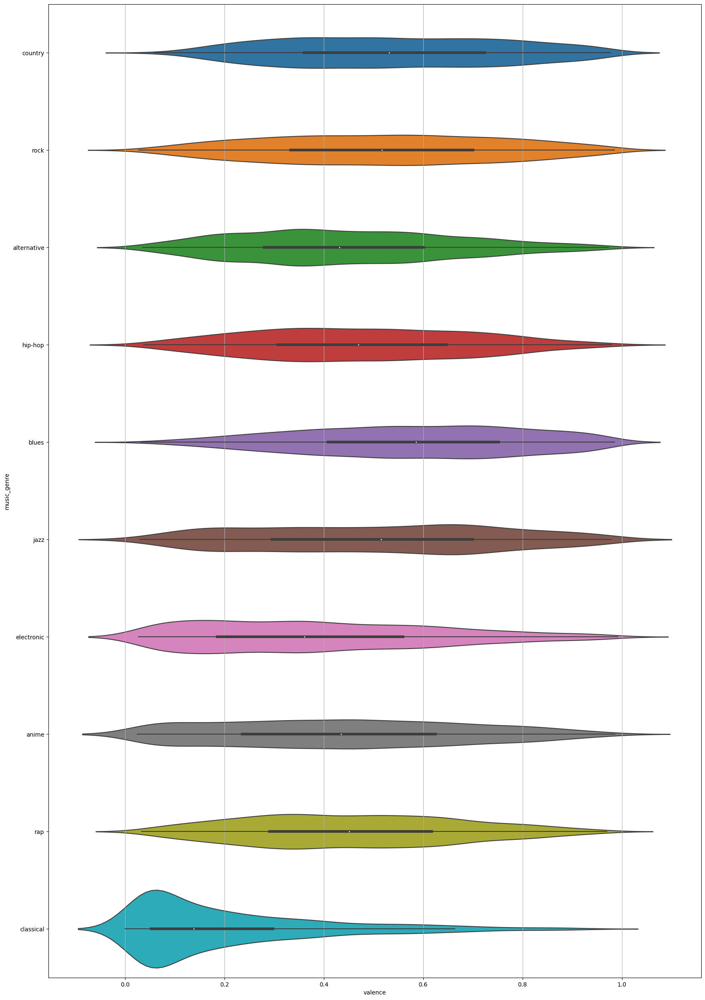

In [100]:
create_category_violinplot(data, 'music_genre', 'valence', True)

За исключением категорий `blues`, `classical`, `electronic` все распределения похожи между собой.
1. Распределение категории `blues` скошено влево
2. Распределения `classical`, `electronic` наоборот скошены вправо

## key - базовый ключ (нота) произведения

In [33]:
data['key'].value_counts()

key
G     2198
C     2052
C#    2022
D     2021
A     1914
F     1539
B     1448
E     1443
G#    1216
A#    1174
F#    1145
D#     582
Name: count, dtype: int64

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


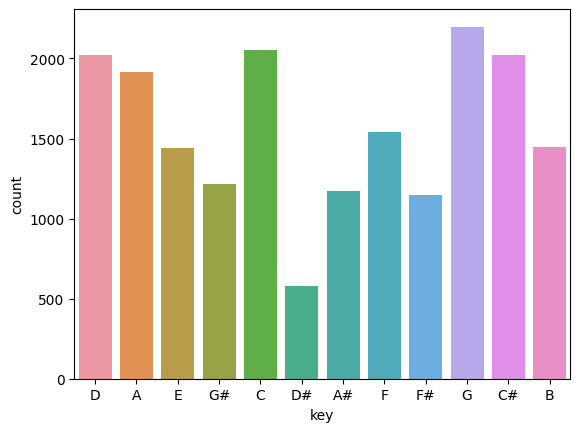

In [35]:
create_countplot(data, 'key')

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

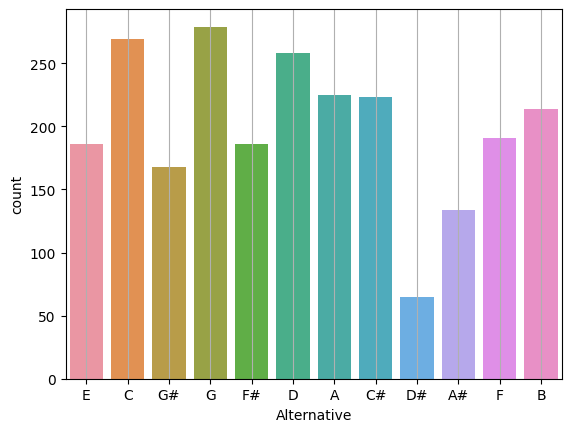

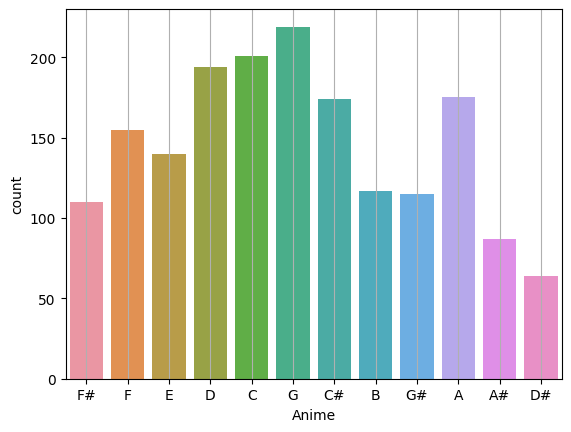

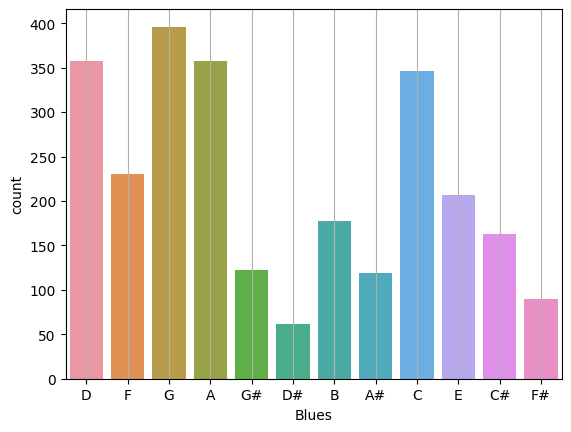

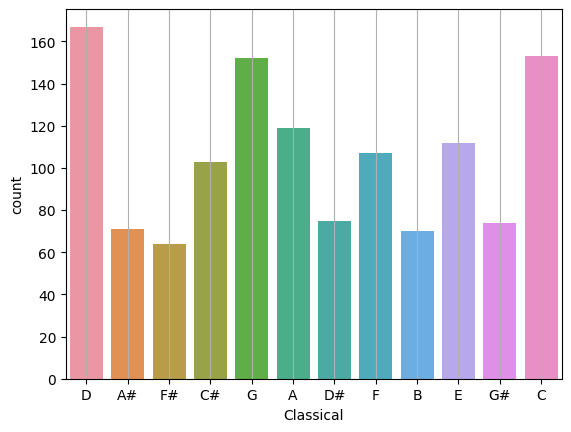

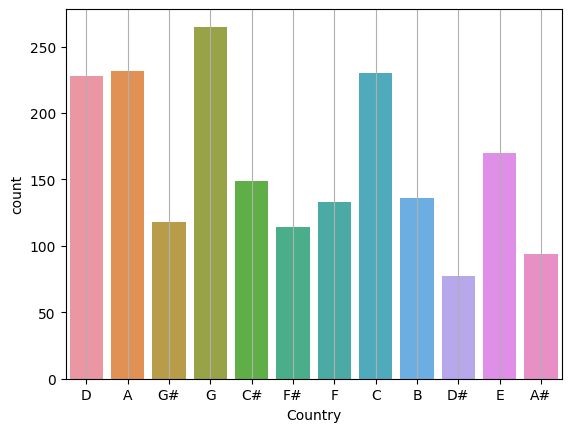

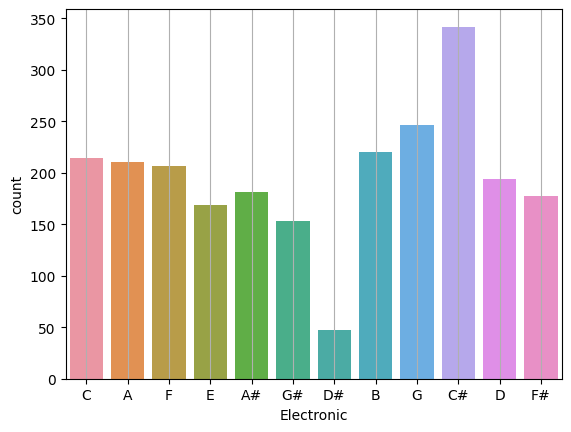

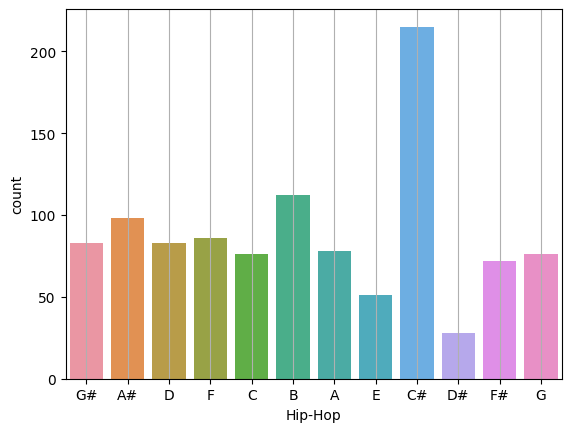

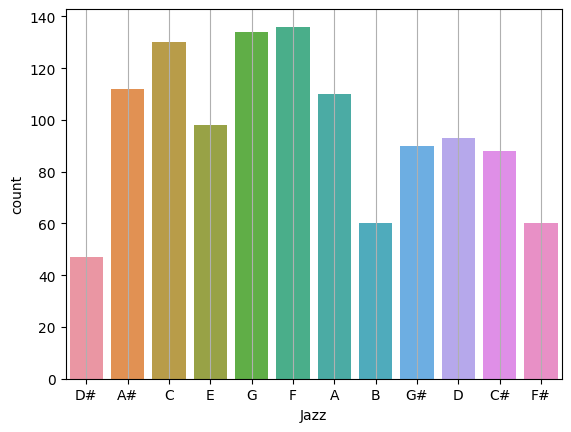

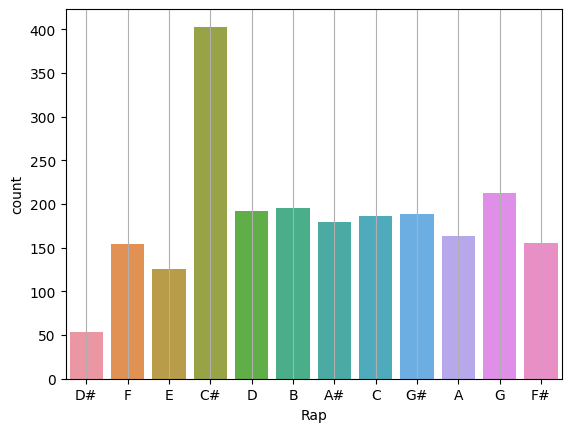

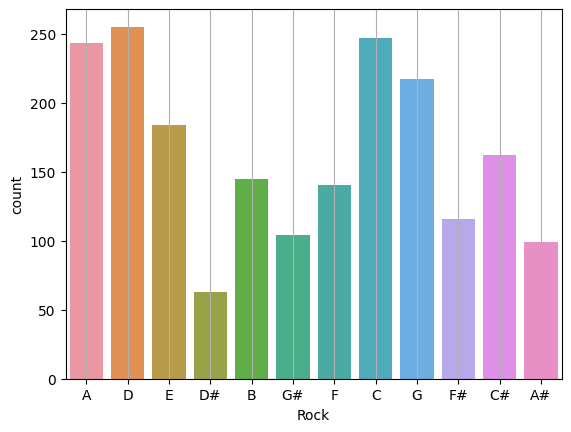

In [36]:
create_category_countplot(data, 'music_genre', 'key')

## mode - указывает на модальность (мажорную или минорную) трека

In [26]:
data['mode'].value_counts()

mode
Major    12113
Minor     6641
Name: count, dtype: int64

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


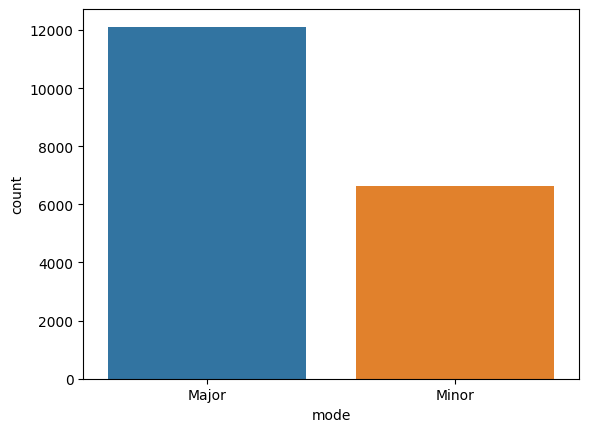

In [37]:
create_countplot(data, 'mode')

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

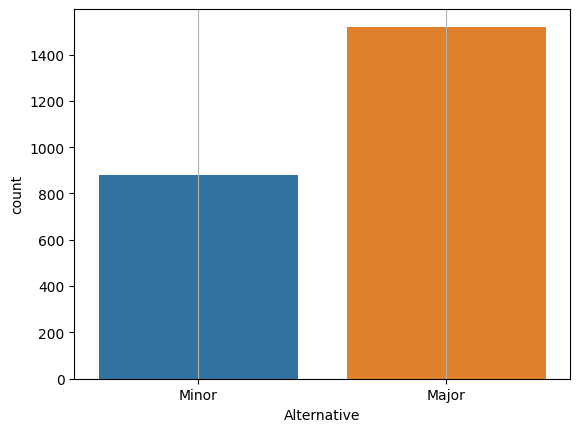

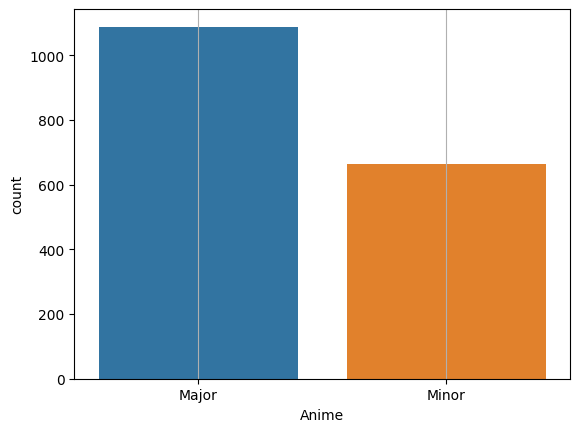

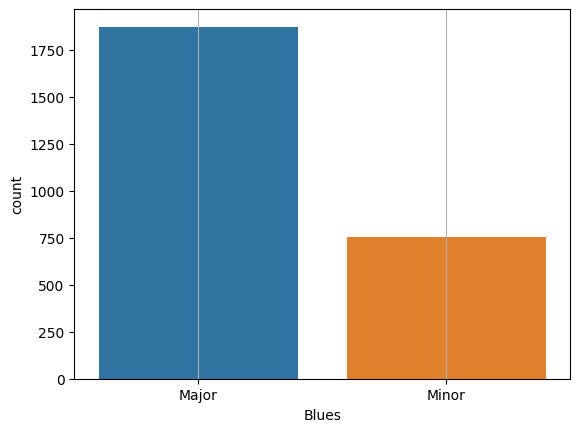

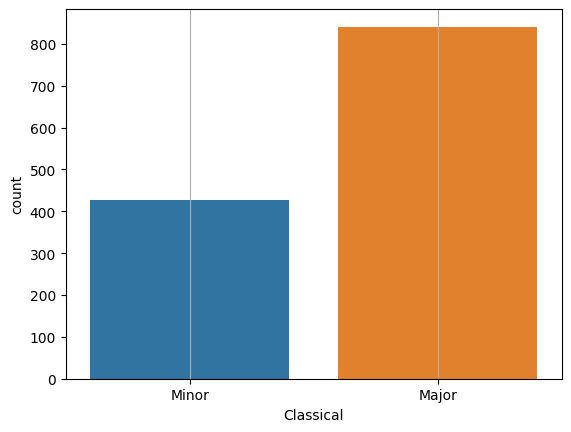

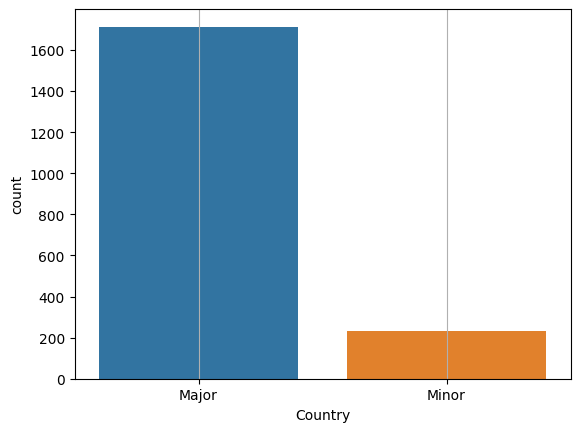

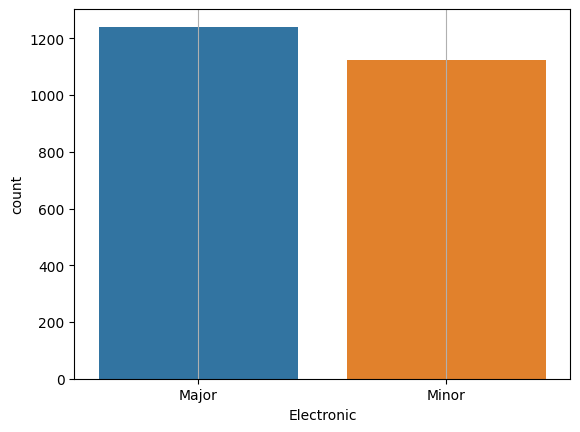

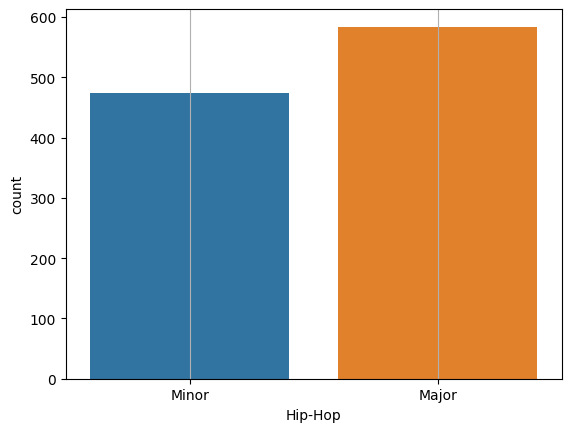

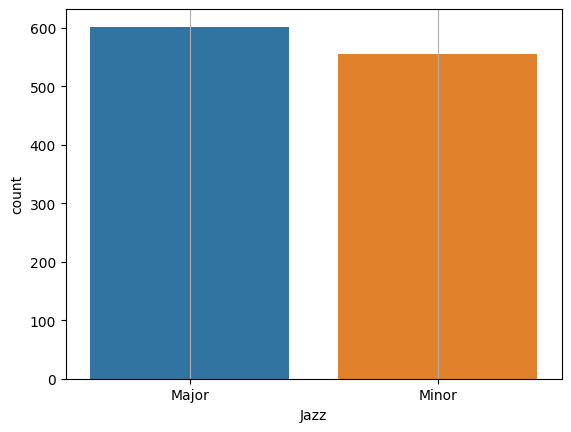

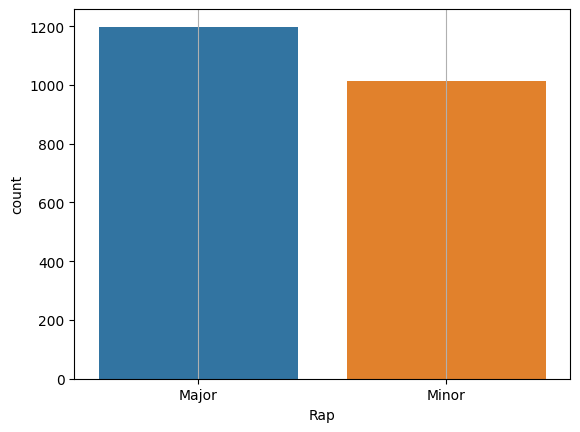

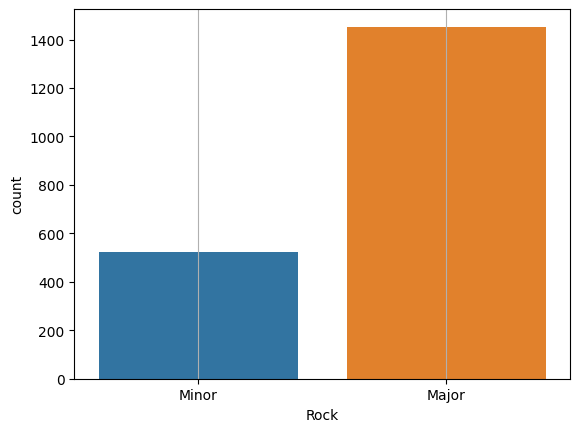

In [38]:
create_category_countplot(data, 'music_genre', 'mode')

d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\practicum\data_science\music_genre\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. 

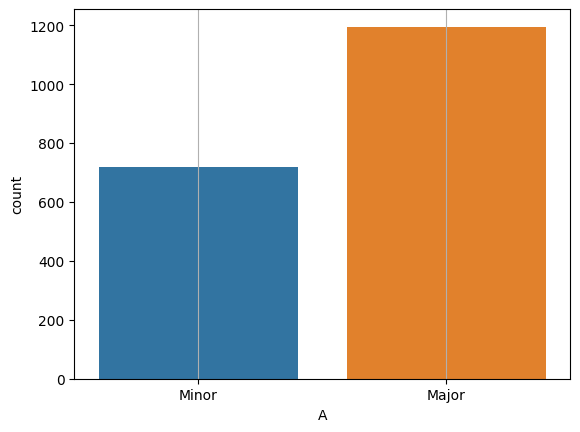

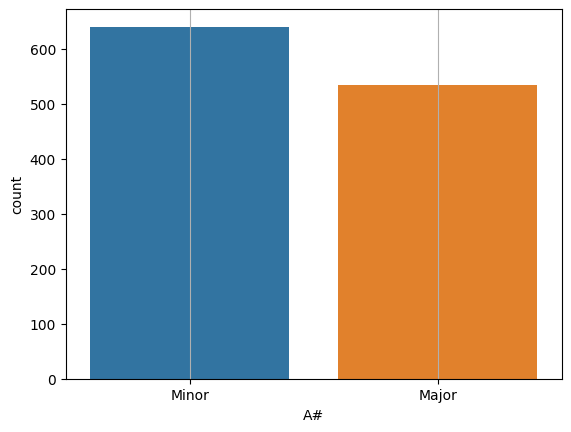

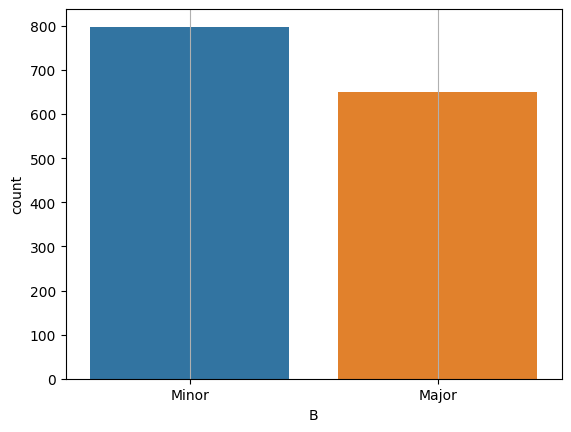

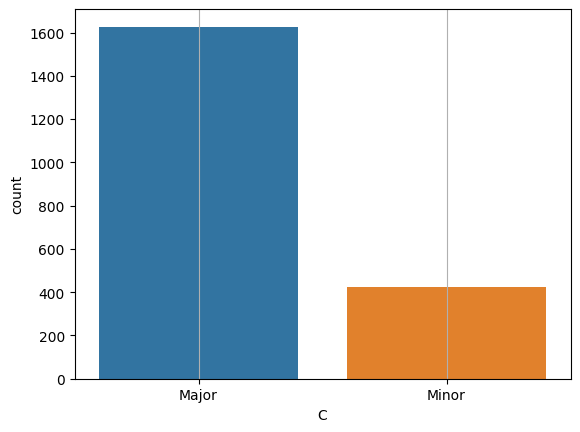

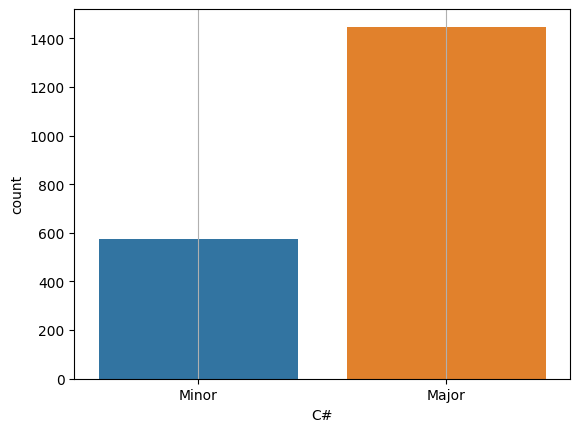

...

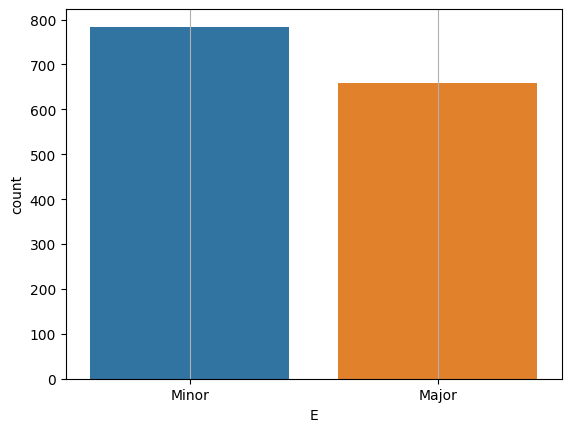

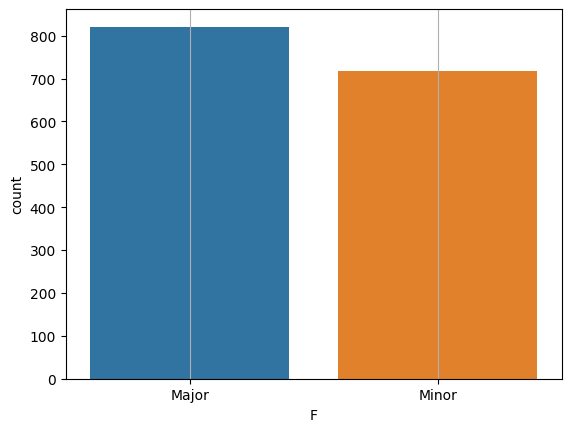

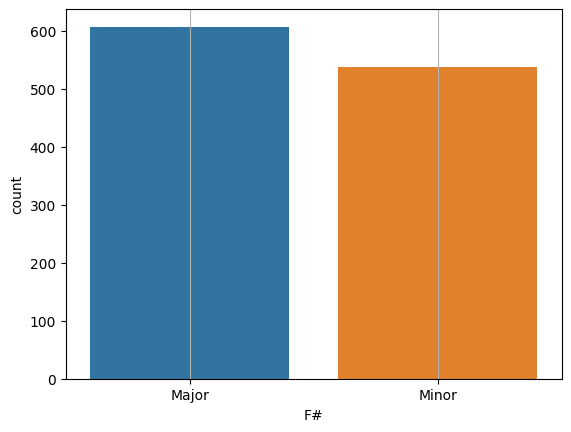

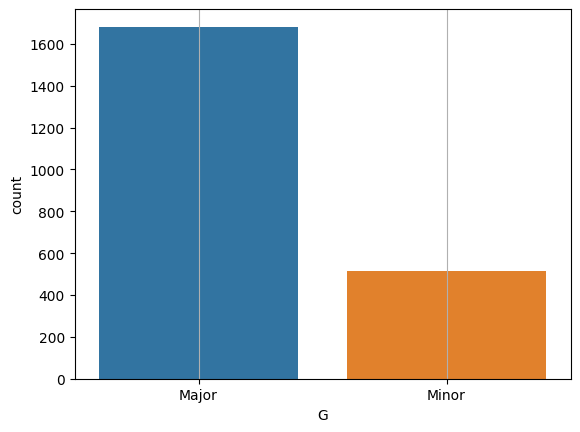

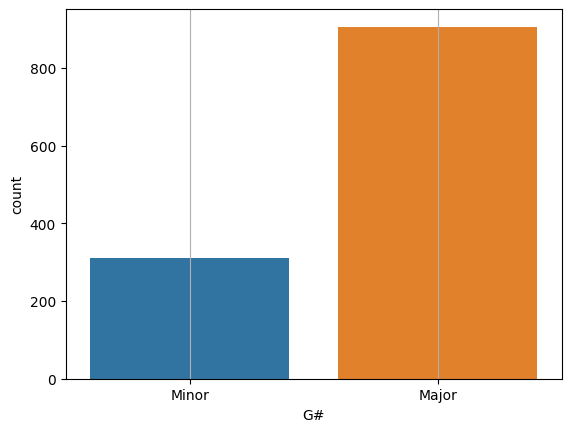

In [39]:
create_category_countplot(data, 'key', 'mode')